# BBM418 / AIN433 — Fundamentals of Computer Vision  
## Programming Assignment 2: Object Localization and Single-Object Tracking

### Student Notebook

This notebook is the starter template for the assignment. This is a draft.
You can follow the given structure or you can implement your version.
Feel free to change given code templates.

The assignment has five main parts:

1. Dataset loading and visualization  
2. Search-region sample generation  
3. CNN-based bounding-box regression model  
4. Single-object tracking on validation and test sequences  
5. Validation evaluation and analysis  

Keep your implementation clean, reproducible, and easy to follow.

### Student Info

#### Name:Hüseyin Köroğlu

#### ID:2220356069

## Assignment Setting

You will work with the given single-object tracking dataset.

### Training and Validation Sequences

These contain full ground-truth annotations:

```text
SequenceName/
  img/
    0001.jpg
    0002.jpg
    ...
  groundtruth_rect.txt
```

### Test Sequences

These contain only the first-frame initialization box:

```text
SequenceName/
  img/
    0001.jpg
    0002.jpg
    ...
  init_rect.txt
```

## Important Rule

For validation and test tracking, you may use only the first-frame bounding box to initialize the tracker.

After the first frame, all bounding boxes must be predicted by your tracker.

For validation sequences, later ground-truth boxes may be used **only after tracking** to compute evaluation metrics.

For test sequences, ground truth is hidden and must not be used.

## Expected Output

Your notebook should generate prediction CSV files for the test sequences.

Each file must be saved as:

```text
outputs/test/<sequence_name>_predictions.csv
```

The required CSV format is:

```text
frame,x,y,w,h
1,198,214,34,81
2,197.2,214.1,34.5,80.7
3,195.4,213.9,34.8,81.2
```

Coordinates must be full-frame pixel coordinates in `(x, y, width, height)` format. Do **not** save normalized crop coordinates.

# 0. Imports and Configuration

Run this section first. You may add extra imports if needed.

Make sure the paths below match your local folder structure.

## How the notebook is organized

The notebook follows the five parts of the assignment. Each part builds on the previous one, so cells should be run from top to bottom.

- Part 0 sets up imports, paths and hyperparameters.
- Part 1 loads frames and ground-truth boxes and shows a few examples.
- Part 2 builds the search-region crop and the coordinate conversion functions.
- Part 3 defines the ResNet-18 regression model and the training loop.
- Part 4 runs the trained model as a tracker on the validation and test sequences and saves the prediction CSVs.
- Part 5 computes the evaluation metrics on the validation sequences and shows success and failure frames.

One thing to keep in mind while reading the code: during training the search crop is built around the previous *ground-truth* box, but at tracking time it is built around the previous *prediction*. This mismatch is the main reason the per-frame crop IoU during training looks much higher than the full-sequence tracking IoU at test time.


In [64]:
# =============================================================================
# IMPORTS — libraries used across the whole notebook
# =============================================================================
# cv2: read images (BGR), draw rectangles
# torch / torchvision: CNN model, DataLoader, ImageNet normalization
# pandas: tables for validation metrics
# =============================================================================
import os
import csv
import math
import random
import time
from pathlib import Path
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms

# Inline plotting in Jupyter / Colab.
%matplotlib inline

In Google Colab environment, to download the dataset and extract it to the working directory you may use the following cell.

In [65]:
from google.colab import drive
drive.mount("/content/drive")

import os

DATASET_ZIP = "/content/drive/MyDrive/dataset.zip"

print("zip exists:", os.path.exists(DATASET_ZIP))

!rm -rf /content/data/sequences /content/data/splits
!unzip -q "$DATASET_ZIP" -d /content/

Mounted at /content/drive
zip exists: True


## Reproducibility

Set random seeds so your results are more reproducible.
Include your seeds if you introduce additional randomness.

In [66]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Make convolutions deterministic. This slightly slows training but the
# deterministic behaviour is helpful for grading.
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Paths and Hyperparameters

Update `DATA_ROOT` if your dataset is located somewhere else.

The suggested hyperparameters are only starting points. You may change them, but report your final choices in the discussion section.

In [67]:
# =============================================================================
# PATHS & HYPERPARAMETERS
# =============================================================================
# DATA_ROOT: folder with one subfolder per sequence (img/ + groundtruth or init)
# SPLIT_ROOT: train.txt, val.txt, test.txt — which sequences to use
# SEARCH_SCALE: crop side = scale * max(prev_w, prev_h); 2.5 is a common default
# =============================================================================
# --------------------------------------------------------------------------- #
# Auto-detect dataset location.
#
# On Google Colab the gdown cell extracts the archive to /content/data, so the
# notebook's working dir already contains a ``data/`` folder.  When running
# locally I unpacked the archive next to the notebook into ``dataset/data/``.
# Both layouts contain the same ``sequences/`` and ``splits/`` subfolders, so
# we just probe a few candidates and keep the first one that exists.
# --------------------------------------------------------------------------- #

_DATA_CANDIDATES = [
    Path("data"),
    Path("dataset/data"),
    Path("/content/data"),
]

_DATA_BASE = None
for _cand in _DATA_CANDIDATES:
    if (_cand / "sequences").exists() and (_cand / "splits").exists():
        _DATA_BASE = _cand
        break

if _DATA_BASE is None:
    # Fall back to the Colab default; this matches the gdown cell above.
    _DATA_BASE = Path("data")

DATA_ROOT = _DATA_BASE / "sequences"
SPLIT_ROOT = _DATA_BASE / "splits"

OUTPUT_ROOT = Path("outputs")
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
(OUTPUT_ROOT / "validation").mkdir(parents=True, exist_ok=True)
(OUTPUT_ROOT / "test").mkdir(parents=True, exist_ok=True)

CHECKPOINT_ROOT = Path("checkpoint")
CHECKPOINT_ROOT.mkdir(parents=True, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGE_SIZE       = 224
SEARCH_SCALE     = 2.5
BATCH_SIZE       = 32
NUM_EPOCHS       = 15        # ↑ from 10 (with lower LR + early stopping)
LEARNING_RATE    = 5e-5      # ↓ from 1e-4 — pretrained ResNet was overfitting in 1 epoch
WEIGHT_DECAY     = 1e-4      # NEW — L2 regularization to slow overfit
NUM_WORKERS      = 2 if torch.cuda.is_available() else 0

# Tracking-time motion clamp: max per-frame center shift, as a fraction of
# the previous box size. 0 disables clamping. 0.5 = at most 50% of the
# box width/height of jump per frame, which kills most catastrophic drift.
MOTION_CLAMP     = 0.5

# Sequences used for the quick per-epoch tracking eval that selects the
# 'best' checkpoint by REAL tracking IoU (not crop IoU). Keep this small
# (3-4 seqs) — runs full tracking each epoch, adds ~10-30 s per epoch.
QUICK_TRACK_VAL_SEQS = ["CarDark", "Man", "Basketball"]

print("Device     :", DEVICE)
print("DATA_ROOT  :", DATA_ROOT.resolve() if DATA_ROOT.exists() else f"{DATA_ROOT} (missing)")
print("SPLIT_ROOT :", SPLIT_ROOT.resolve() if SPLIT_ROOT.exists() else f"{SPLIT_ROOT} (missing)")
print("OUTPUT_ROOT:", OUTPUT_ROOT.resolve())

Device     : cuda
DATA_ROOT  : /content/data/sequences
SPLIT_ROOT : /content/data/splits
OUTPUT_ROOT: /content/outputs


# PART 1 — Dataset Loading and Visualization

In this part, you will implement utilities for loading the dataset and visualizing bounding boxes.

You need separate loading functions for:

- training/validation sequences with `groundtruth_rect.txt`,
- test sequences with `init_rect.txt`.

This distinction is important because test sequences do not contain full ground truth.

## 1.1 Bounding-Box File Reader

The annotation files contain bounding boxes in the format:

```text
x,y,width,height
```

Some files may use commas, spaces, or tabs as separators. Your parser should handle these cases.

In [68]:
# =============================================================================
# read_bbox_file — parse groundtruth_rect.txt / init_rect.txt
# =============================================================================
# Format per line: x, y, width, height (top-left corner + size in pixels)
# Handles commas, tabs, spaces, and Windows line endings
# =============================================================================
def read_bbox_file(path: Path) -> np.ndarray:
    """
    Read a bounding-box file.

    The file may contain one or many lines. Each line stores
    ``x, y, width, height``. Different sequences in this dataset use
    different separators (commas, tabs, or whitespace) and Windows line
    endings (``\\r\\n``) appear occasionally, so we normalize line endings
    first and then split each line on any whitespace or comma.
    """
    path = Path(path)
    with open(path, "r") as f:
        raw = f.read()

    # Normalize CRLF / CR to LF.
    raw = raw.replace("\r\n", "\n").replace("\r", "\n")

    rows: List[List[float]] = []
    for line in raw.split("\n"):
        line = line.strip()
        if not line:
            continue
        # Replace commas/tabs with a single space, then split on whitespace.
        line = line.replace(",", " ").replace("\t", " ")
        parts = [p for p in line.split() if p]
        if len(parts) < 4:
            raise ValueError(
                f"Bad bbox line in {path}: expected 4 numbers, got {parts!r}"
            )
        rows.append([float(parts[0]), float(parts[1]), float(parts[2]), float(parts[3])])

    if not rows:
        raise ValueError(f"No bounding boxes parsed from {path}")

    return np.asarray(rows, dtype=np.float64)

## 1.2 Frame Path Reader

This function should read all frame paths from the `img/` folder and sort them in frame order.

In [69]:
# =============================================================================
# get_frame_paths — list all images in sequence/img/ in sorted order
# =============================================================================
def get_frame_paths(sequence_path: Path) -> List[Path]:
    """
    Return frame paths from ``sequence_path/img/`` sorted lexicographically.

    The dataset stores zero-padded filenames (e.g. ``0001.jpg``) so a plain
    sorted lexicographic order is identical to the numeric frame order.
    """
    img_dir = Path(sequence_path) / "img"
    if not img_dir.exists():
        raise FileNotFoundError(f"Frame folder missing: {img_dir}")

    paths = sorted(
        p for p in img_dir.iterdir()
        if p.is_file() and p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp"}
    )
    if not paths:
        raise RuntimeError(f"No frames found under {img_dir}")
    return paths

## 1.3 Load Training / Validation Sequences

Training and validation sequences contain full ground truth.

Your loader must check that:

```text
number of frames == number of ground-truth boxes
```

If there is a mismatch, raise an error. Do not silently truncate frames or annotations.

In [70]:
# =============================================================================
# load_sequence_with_gt — frames + full GT for train/val sequences
# =============================================================================
# Asserts #frames == #boxes so labels never drift from images
# =============================================================================
def load_sequence_with_gt(sequence_path: Path) -> Tuple[List[Path], np.ndarray]:
    """
    Load a training/validation sequence: frame paths + per-frame ground truth.

    Raises ``AssertionError`` if the number of frames does not match the number
    of ground-truth boxes -- silently truncating to the smaller length would
    desynchronize labels.
    """
    sequence_path = Path(sequence_path)
    frame_paths = get_frame_paths(sequence_path)
    bboxes = read_bbox_file(sequence_path / "groundtruth_rect.txt")

    assert len(frame_paths) == len(bboxes), (
        f"Frame/GT count mismatch in {sequence_path.name}: "
        f"{len(frame_paths)} frames vs {len(bboxes)} bboxes"
    )
    return frame_paths, bboxes

## 1.4 Load Test Sequences

Test sequences contain only `init_rect.txt`.

This file contains one bounding box: the first-frame initialization box.

Your test loader should not expect `groundtruth_rect.txt`.

In [71]:
# =============================================================================
# load_test_sequence — frames + only the first-frame init box (test set)
# =============================================================================
def load_test_sequence(sequence_path: Path) -> Tuple[List[Path], np.ndarray]:
    """
    Load a hidden test sequence: frame paths and the first-frame init box.
    """
    sequence_path = Path(sequence_path)
    frame_paths = get_frame_paths(sequence_path)

    init_path = sequence_path / "init_rect.txt"
    if not init_path.exists():
        raise FileNotFoundError(f"init_rect.txt missing for test sequence: {sequence_path}")

    bboxes = read_bbox_file(init_path)
    initial_bbox = np.asarray(bboxes[0], dtype=np.float64)
    return frame_paths, initial_bbox

## 1.5 Image Reading and Drawing Utilities

Implement helper functions for reading RGB images and drawing bounding boxes.

These functions will be used throughout the notebook.

In [72]:
# =============================================================================
# read_image_rgb / draw_bbox / show_image — visualization helpers
# =============================================================================
def read_image_rgb(path: Path) -> np.ndarray:
    """
    Read an image with OpenCV and convert it from BGR to RGB.
    """
    path = Path(path)
    img_bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img_bgr is None:
        raise FileNotFoundError(f"Could not read image: {path}")
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb


def draw_bbox(
    image: np.ndarray,
    bbox: np.ndarray,
    color: Tuple[int, int, int] = (0, 255, 0),
    thickness: int = 2,
    label: Optional[str] = None,
) -> np.ndarray:
    """
    Draw a bounding box (and optional label) on a copy of ``image``.

    ``bbox`` is in ``(x, y, w, h)`` format.  Inputs are floats; we round to
    ints just for the drawing call.
    """
    out = image.copy()
    if bbox is None:
        return out

    x, y, w, h = [float(v) for v in bbox]
    x1, y1 = int(round(x)), int(round(y))
    x2, y2 = int(round(x + w)), int(round(y + h))
    cv2.rectangle(out, (x1, y1), (x2, y2), color, thickness)

    if label:
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        font_thickness = 1
        (tw, th), baseline = cv2.getTextSize(label, font, font_scale, font_thickness)
        # Filled background box for the label, just above the bounding box.
        ty = max(y1 - 4, th + 2)
        cv2.rectangle(
            out,
            (x1, ty - th - 2),
            (x1 + tw + 2, ty + baseline - 2),
            color,
            thickness=-1,
        )
        cv2.putText(out, label, (x1 + 1, ty - 2), font, font_scale, (0, 0, 0), font_thickness, cv2.LINE_AA)

    return out


def show_image(image: np.ndarray, title: str = "", figsize: Tuple[int, int] = (6, 4)):
    """Display an RGB image using matplotlib."""
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.title(title)
    plt.show()

## 1.6 Sequence Listing

This helper is useful for checking which sequences exist under `DATA_ROOT`.

In [73]:
# =============================================================================
# list_sequences — discover valid sequence folders under DATA_ROOT
# =============================================================================
def list_sequences(data_root: Path) -> List[str]:
    """
    Return the names of valid sequence folders under ``data_root``.

    A sequence folder is considered valid if it contains an ``img/`` subfolder
    and at least one of ``groundtruth_rect.txt`` or ``init_rect.txt``.
    """
    data_root = Path(data_root)
    if not data_root.exists():
        raise FileNotFoundError(f"data_root does not exist: {data_root}")

    names: List[str] = []
    for entry in sorted(data_root.iterdir()):
        if not entry.is_dir():
            continue
        if not (entry / "img").is_dir():
            continue
        has_gt = (entry / "groundtruth_rect.txt").exists()
        has_init = (entry / "init_rect.txt").exists()
        if has_gt or has_init:
            names.append(entry.name)
    return names

## 1.7 Visualization Task

Visualize at least five frames from at least two training/validation sequences.

For each visualized frame, draw the ground-truth bounding box.

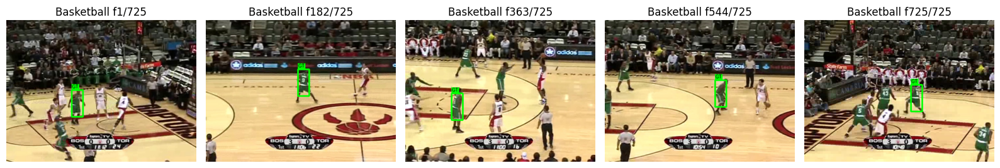

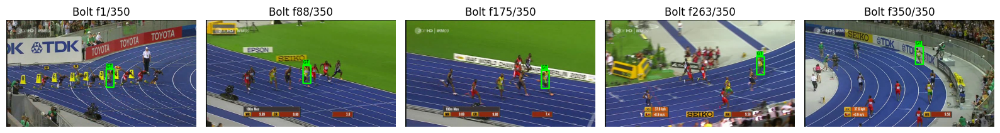

In [74]:
# =============================================================================
# VISUALIZATION — sample frames with GT boxes (sanity check Part 1)
# =============================================================================
def _evenly_spaced_indices(n: int, k: int) -> List[int]:
    """Return ``k`` indices evenly spaced over ``range(n)``."""
    if n <= 1:
        return [0] * k
    if k == 1:
        return [0]
    return [int(round(i * (n - 1) / (k - 1))) for i in range(k)]


def visualize_sequence_frames(
    sequence_name: str,
    num_frames: int = 5,
    figsize: Tuple[int, int] = (16, 4),
):
    """Show ``num_frames`` evenly spaced frames of ``sequence_name`` with GT bboxes."""
    seq_path = DATA_ROOT / sequence_name
    frame_paths, gt = load_sequence_with_gt(seq_path)

    indices = _evenly_spaced_indices(len(frame_paths), num_frames)

    fig, axes = plt.subplots(1, num_frames, figsize=figsize)
    if num_frames == 1:
        axes = [axes]
    for ax, idx in zip(axes, indices):
        img = read_image_rgb(frame_paths[idx])
        img = draw_bbox(img, gt[idx], color=(0, 255, 0), thickness=3, label="GT")
        ax.imshow(img)
        ax.set_title(f"{sequence_name} f{idx + 1}/{len(frame_paths)}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


# Pick two visually distinct sequences for sanity checking.
for _seq in ["Basketball", "Bolt"]:
    if (DATA_ROOT / _seq).exists() and (DATA_ROOT / _seq / "groundtruth_rect.txt").exists():
        visualize_sequence_frames(_seq, num_frames=5)
    else:
        print(f"[warn] sequence not available: {_seq}")

# Split Handling

The assignment uses fixed train/validation/test splits.

Use only the provided split files:

```text
splits/train.txt
splits/val.txt
splits/test.txt
```

Each file contains one sequence name per line.

## Split File Loading

Implement the functions below to read split files and verify that the sequence folders match the expected format.

In [75]:
# =============================================================================
# SPLIT FILES — load train/val/test lists and verify required annotation files
# =============================================================================
def read_split_file(split_path: Path) -> List[str]:
    """Read sequence names from a split file (one name per line)."""
    split_path = Path(split_path)
    with open(split_path, "r") as f:
        names = [ln.strip() for ln in f.read().splitlines()]
    return [n for n in names if n]


def load_splits(split_root: Path) -> Tuple[List[str], List[str], List[str]]:
    """Load ``train.txt``, ``val.txt`` and ``test.txt`` from ``split_root``."""
    split_root = Path(split_root)
    train_seqs = read_split_file(split_root / "train.txt")
    val_seqs = read_split_file(split_root / "val.txt")
    test_seqs = read_split_file(split_root / "test.txt")
    return train_seqs, val_seqs, test_seqs


def verify_split_files(
    data_root: Path,
    train_sequences: List[str],
    val_sequences: List[str],
    test_sequences: List[str],
):
    """
    Make sure every train/val sequence has ``groundtruth_rect.txt``
    and every test sequence has ``init_rect.txt``.

    Prints a short summary; raises ``AssertionError`` on the first problem.
    """
    data_root = Path(data_root)
    problems: List[str] = []

    for split_name, seqs, required in [
        ("train", train_sequences, "groundtruth_rect.txt"),
        ("val",   val_sequences,   "groundtruth_rect.txt"),
        ("test",  test_sequences,  "init_rect.txt"),
    ]:
        for name in seqs:
            seq_dir = data_root / name
            if not seq_dir.is_dir():
                problems.append(f"[{split_name}] missing folder: {seq_dir}")
                continue
            if not (seq_dir / "img").is_dir():
                problems.append(f"[{split_name}] no img/ folder: {seq_dir}")
            if not (seq_dir / required).exists():
                problems.append(f"[{split_name}] no {required}: {seq_dir}")

    if problems:
        for p in problems[:20]:
            print("  -", p)
        raise AssertionError(f"verify_split_files failed with {len(problems)} problem(s)")

    print(
        f"Splits verified: "
        f"{len(train_sequences)} train, {len(val_sequences)} val, "
        f"{len(test_sequences)} test sequences."
    )

## Load Splits

Run this cell after implementing the split-loading functions.

In [76]:
# =============================================================================
# LOAD SPLITS — run once; defines train_sequences, val_sequences, test_sequences
# =============================================================================
train_sequences, val_sequences, test_sequences = load_splits(SPLIT_ROOT)
verify_split_files(DATA_ROOT, train_sequences, val_sequences, test_sequences)

print("Train     :", train_sequences)
print("Validation:", val_sequences)
print("Test      :", test_sequences)

Splits verified: 39 train, 11 val, 7 test sequences.
Train     : ['Deer', 'Crossing', 'Boy', 'Car1', 'Walking2', 'Doll', 'BlurCar4', 'FleetFace', 'BlurCar3', 'Matrix', 'Car4', 'Skating2', 'Liquor', 'Trellis', 'Biker', 'Twinnings', 'Tiger2', 'Couple', 'Trans', 'Football', 'Dancer', 'Singer1', 'Lemming', 'BlurCar1', 'Dudek', 'Freeman1', 'BlurOwl', 'Subway', 'Bolt2', 'Skater2', 'Singer2', 'Board', 'Skating1', 'Car2', 'Mhyang', 'BlurBody', 'BlurCar2', 'Car24', 'Jogging']
Validation: ['Bird2', 'Fish', 'Human4', 'ClifBar', 'Bolt', 'MountainBike', 'CarDark', 'Man', 'Basketball', 'Crowds', 'Box']
Test      : ['TestSeq1', 'TestSeq2', 'TestSeq3', 'TestSeq4', 'TestSeq5', 'TestSeq6', 'TestSeq7']


# (Optional) Dataset Exploration

This section is not required for implementation, but it is helpful for understanding the dataset.

You may use these cells to inspect:

- sequence lengths,
- bounding-box size distribution,
- object trajectory,
- scale changes.

These visualizations can also help your discussions.

## (Optional) Dataset Summary

After loading the splits, summarize the number of frames and bounding-box sizes in the training and validation sets.

In [77]:
# =============================================================================
# (OPTIONAL) Dataset summary — frame counts and average box sizes per sequence
# =============================================================================
def summarize_split(split_name: str, sequence_names: List[str]) -> pd.DataFrame:
    """Per-sequence summary: frame count, mean bbox width/height/area."""
    rows = []
    for seq in sequence_names:
        seq_dir = DATA_ROOT / seq
        try:
            frames, gt = load_sequence_with_gt(seq_dir)
        except Exception as exc:
            rows.append({"sequence": seq, "split": split_name, "frames": 0, "error": str(exc)})
            continue
        rows.append({
            "sequence": seq,
            "split": split_name,
            "frames": len(frames),
            "mean_w": float(np.mean(gt[:, 2])),
            "mean_h": float(np.mean(gt[:, 3])),
            "mean_area": float(np.mean(gt[:, 2] * gt[:, 3])),
            "min_area": float(np.min(gt[:, 2] * gt[:, 3])),
            "max_area": float(np.max(gt[:, 2] * gt[:, 3])),
        })
    return pd.DataFrame(rows)


_summary_train = summarize_split("train", train_sequences)
_summary_val   = summarize_split("val",   val_sequences)

print(f"Train: {len(train_sequences)} sequences, "
      f"{int(_summary_train['frames'].sum())} total frames")
print(f"Val  : {len(val_sequences)} sequences, "
      f"{int(_summary_val['frames'].sum())} total frames")

display_summary = pd.concat([_summary_train, _summary_val], ignore_index=True)
display_summary.head(15)

Train: 39 sequences, 26587 total frames
Val  : 11 sequences, 5052 total frames


,sequence,split,frames,mean_w,mean_h,mean_area,min_area,max_area
0,Deer,train,71,85.253521,56.253521,4814.056338,3528.0,6860.0
1,Crossing,train,120,16.716667,42.158333,713.508333,403.0,1100.0
2,Boy,train,602,34.142857,43.259136,1493.325581,768.0,3283.0
3,Car1,train,1020,25.351961,21.015686,610.291176,255.0,3630.0
4,Walking2,train,500,22.946000,75.992000,1822.510000,686.0,4180.0
5,Doll,train,3872,46.960227,97.453771,4861.623967,2336.0,39744.0
6,BlurCar4,train,380,159.352632,143.573684,22982.307895,17303.0,35148.0
7,FleetFace,train,707,131.097595,154.207921,20841.831683,9152.0,41520.0
8,BlurCar3,train,357,86.173669,70.795518,6104.700280,5082.0,8134.0
9,Matrix,train,100,51.690000,60.020000,3463.330000,1155.0,12900.0


## (Optional) Bounding-Box Distribution

Plot distributions of bounding-box width, height, area, or aspect ratio.

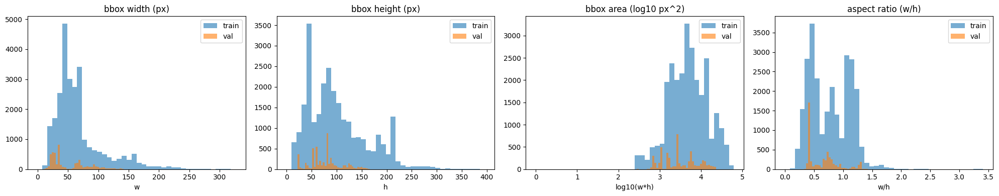

In [78]:
# =============================================================================
# (OPTIONAL) Bbox distribution histograms — understand object scale in the dataset
# =============================================================================
def collect_all_bboxes(sequence_names: List[str]) -> np.ndarray:
    """Concatenate ground-truth bboxes from a list of sequences."""
    all_boxes = []
    for seq in sequence_names:
        try:
            _, gt = load_sequence_with_gt(DATA_ROOT / seq)
            all_boxes.append(gt)
        except Exception:
            pass
    if not all_boxes:
        return np.empty((0, 4))
    return np.concatenate(all_boxes, axis=0)


_train_boxes = collect_all_bboxes(train_sequences)
_val_boxes   = collect_all_bboxes(val_sequences)

fig, axes = plt.subplots(1, 4, figsize=(20, 4))

axes[0].hist(_train_boxes[:, 2], bins=40, alpha=0.6, label="train")
axes[0].hist(_val_boxes[:, 2],   bins=40, alpha=0.6, label="val")
axes[0].set_title("bbox width (px)"); axes[0].set_xlabel("w"); axes[0].legend()

axes[1].hist(_train_boxes[:, 3], bins=40, alpha=0.6, label="train")
axes[1].hist(_val_boxes[:, 3],   bins=40, alpha=0.6, label="val")
axes[1].set_title("bbox height (px)"); axes[1].set_xlabel("h"); axes[1].legend()

train_areas = _train_boxes[:, 2] * _train_boxes[:, 3]
val_areas   = _val_boxes[:,   2] * _val_boxes[:,   3]
axes[2].hist(np.log10(train_areas + 1), bins=40, alpha=0.6, label="train")
axes[2].hist(np.log10(val_areas   + 1), bins=40, alpha=0.6, label="val")
axes[2].set_title("bbox area (log10 px^2)"); axes[2].set_xlabel("log10(w*h)"); axes[2].legend()

train_ar = _train_boxes[:, 2] / np.maximum(_train_boxes[:, 3], 1e-6)
val_ar   = _val_boxes[:,   2] / np.maximum(_val_boxes[:,   3], 1e-6)
axes[3].hist(np.clip(train_ar, 0, 5), bins=40, alpha=0.6, label="train")
axes[3].hist(np.clip(val_ar,   0, 5), bins=40, alpha=0.6, label="val")
axes[3].set_title("aspect ratio (w/h)"); axes[3].set_xlabel("w/h"); axes[3].legend()

plt.tight_layout()
plt.show()

## (Optional) Target Motion Visualization

For one selected sequence, plot the target center coordinates over time.

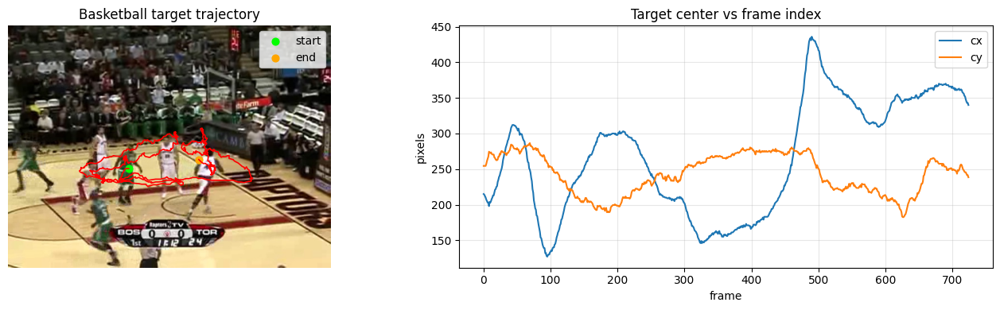

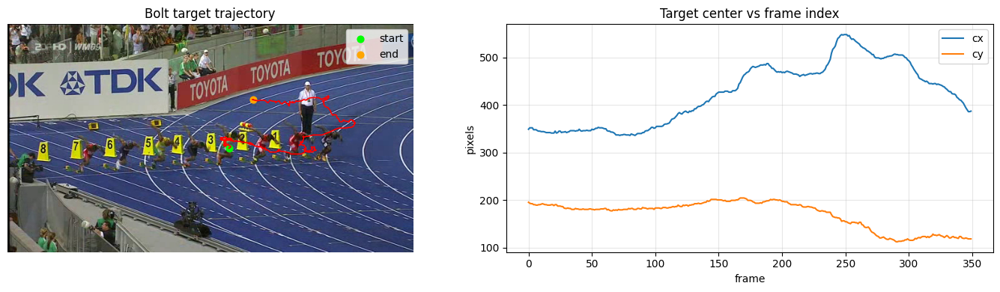

In [79]:
# =============================================================================
# (OPTIONAL) Target trajectory — how the object center moves over time
# =============================================================================
def plot_trajectory(sequence_name: str):
    """Plot the bbox-center trajectory for ``sequence_name`` over its first frame."""
    seq_dir = DATA_ROOT / sequence_name
    frames, gt = load_sequence_with_gt(seq_dir)
    cx = gt[:, 0] + gt[:, 2] / 2.0
    cy = gt[:, 1] + gt[:, 3] / 2.0

    first_img = read_image_rgb(frames[0])
    fig, ax = plt.subplots(1, 2, figsize=(14, 4))

    ax[0].imshow(first_img)
    ax[0].plot(cx, cy, "-r", linewidth=1.2)
    ax[0].scatter(cx[0],  cy[0],  c="lime",   s=40, label="start")
    ax[0].scatter(cx[-1], cy[-1], c="orange", s=40, label="end")
    ax[0].set_title(f"{sequence_name} target trajectory")
    ax[0].axis("off"); ax[0].legend()

    ax[1].plot(cx, label="cx"); ax[1].plot(cy, label="cy")
    ax[1].set_title("Target center vs frame index")
    ax[1].set_xlabel("frame"); ax[1].set_ylabel("pixels")
    ax[1].legend(); ax[1].grid(alpha=0.3)
    plt.tight_layout(); plt.show()


for _seq in ["Basketball", "Bolt"]:
    if (DATA_ROOT / _seq / "groundtruth_rect.txt").exists():
        plot_trajectory(_seq)

# PART 2 — Search-Region Sample Generation

In single-object tracking, the target is initialized in the first frame. For later frames, the tracker searches around the previous target location.

In this assignment, you will train a model that receives a local search crop and predicts the target box inside that crop.

For a pair of consecutive frames:

```text
Frame t-1 bbox -> used to define the search region in frame t
Frame t bbox   -> target label inside the search region
```

## 2.1 Crop Metadata

`CropInfo` stores the information needed to convert between:

- full-frame coordinates,
- crop-local normalized coordinates.

In [80]:
@dataclass
class CropInfo:
    """
    Metadata for mapping between crop coordinates and full-frame coordinates.

    x1, y1:
        Top-left location of the crop in the original image coordinate system.
        These may be negative if padding is used.

    crop_size:
        Side length of the square crop in original image pixels.

    output_size:
        Side length after resizing the crop for the CNN.
    """
    x1: float
    y1: float
    crop_size: float
    output_size: int

## 2.2 Bounding-Box Helper Functions

Implement simple helper functions for bounding-box center computation and clipping predictions to image boundaries.

In [81]:
# =============================================================================
# bbox_center / clip_bbox_to_image — geometry helpers for crops and tracking
# =============================================================================
def bbox_center(bbox: np.ndarray) -> Tuple[float, float]:
    """Compute the center of a bbox stored as ``(x, y, w, h)``."""
    x, y, w, h = [float(v) for v in bbox]
    return x + w / 2.0, y + h / 2.0


def clip_bbox_to_image(bbox: np.ndarray, image_shape: Tuple[int, int, int]) -> np.ndarray:
    """
    Clip a bbox to image boundaries while keeping width/height positive.

    ``image_shape`` is the standard NumPy ``(H, W, C)`` shape tuple.
    """
    h_img, w_img = image_shape[:2]
    x, y, w, h = [float(v) for v in bbox]

    x1 = max(0.0, min(x, w_img - 1.0))
    y1 = max(0.0, min(y, h_img - 1.0))
    x2 = max(0.0, min(x + w, float(w_img)))
    y2 = max(0.0, min(y + h, float(h_img)))

    new_w = max(1.0, x2 - x1)
    new_h = max(1.0, y2 - y1)
    return np.array([x1, y1, new_w, new_h], dtype=np.float64)

## 2.3 Search-Region Crop

Use a square search region centered around the previous bounding box.

The recommended crop size is:

```text
crop_size = scale × max(previous_width, previous_height)
```

A reasonable default value is `scale = 2.5`.

If the crop goes outside the image, handle the boundary carefully. You may use padding or clipping, but your coordinate conversion must remain correct.

In [82]:
# =============================================================================
# crop_search_region — core of Part 2
# =============================================================================
# 1) Square crop centered on previous box, side = scale * max(w,h)
# 2) Pad with grey if crop goes off image (pad-then-crop)
# 3) Resize to 224x224 for the CNN
# 4) Return CropInfo so we can map coords between full image and crop
# =============================================================================
def crop_search_region(
    image: np.ndarray,
    previous_bbox: np.ndarray,
    scale: float = 2.5,
    output_size: int = IMAGE_SIZE,
    pad_value: Tuple[int, int, int] = (128, 128, 128),
) -> Tuple[np.ndarray, CropInfo]:
    """
    Crop a square search region around the previous bounding box.

    Returns:
        crop_resized: RGB crop resized to output_size x output_size
        crop_info: metadata for coordinate conversion
    """
    h_img, w_img = image.shape[:2]
    prev_x, prev_y, prev_w, prev_h = [float(v) for v in previous_bbox]

    # Side length of square search window (at least 2 px)
    crop_size = max(2.0, scale * max(prev_w, prev_h))
    cx, cy = bbox_center(previous_bbox)
    # Top-left of crop in original image coords (may be negative -> need padding)
    x1 = cx - crop_size / 2.0
    y1 = cy - crop_size / 2.0
    x2 = x1 + crop_size
    y2 = y1 + crop_size

    # All four pads use ceil so that after padding the slice indices below
    # are guaranteed to be in-range (even when x1, y1, x2, y2 are fractional).
    pad_left   = int(max(0.0, np.ceil(-x1)))
    pad_top    = int(max(0.0, np.ceil(-y1)))
    pad_right  = int(max(0.0, np.ceil(x2 - w_img)))
    pad_bottom = int(max(0.0, np.ceil(y2 - h_img)))

    if any(v > 0 for v in [pad_left, pad_top, pad_right, pad_bottom]):
        padded = cv2.copyMakeBorder(
            image,
            pad_top,
            pad_bottom,
            pad_left,
            pad_right,
            borderType=cv2.BORDER_CONSTANT,
            value=pad_value,
        )
    else:
        padded = image

    x1_pad = x1 + pad_left
    y1_pad = y1 + pad_top
    x2_pad = x2 + pad_left
    y2_pad = y2 + pad_top

    crop = padded[int(np.floor(y1_pad)):int(np.ceil(y2_pad)), int(np.floor(x1_pad)):int(np.ceil(x2_pad))]
    if crop.size == 0:
        raise RuntimeError("Empty crop generated. Check crop bounds and padding logic.")

    # CNN expects fixed size; linear resize preserves appearance reasonably
    crop_resized = cv2.resize(crop, (output_size, output_size), interpolation=cv2.INTER_LINEAR)
    crop_info = CropInfo(x1=x1, y1=y1, crop_size=crop_size, output_size=output_size)
    return crop_resized, crop_info

## 2.4 Coordinate Conversion

The model predicts boxes inside the crop, but the final tracking output must be in full-frame coordinates.

You need two conversions:

1. Full-frame bbox → crop-local normalized bbox  
2. Crop-local normalized bbox → full-frame bbox

In [83]:
# =============================================================================
# Coordinate conversion — full-frame <-> normalized crop-local (x,y,w,h)
# =============================================================================
# Training target and model output live in [0,1] relative to the crop square
# =============================================================================
def bbox_to_crop_coordinates(bbox: np.ndarray, crop_info: CropInfo) -> np.ndarray:
    """
    Convert a full-frame bbox to crop-local *normalized* coordinates.

    ``normalized_bbox`` is produced by dividing the offset and the size by
    ``crop_info.crop_size``. Values are usually in ``[0, 1]`` but may fall
    slightly outside this range if the target leaves the crop -- we
    intentionally do **not** clamp here so the regression loss can still
    penalize predictions outside the crop.
    """
    x, y, w, h = [float(v) for v in bbox]
    cs = float(crop_info.crop_size)
    nx = (x - crop_info.x1) / cs
    ny = (y - crop_info.y1) / cs
    nw = w / cs
    nh = h / cs
    return np.array([nx, ny, nw, nh], dtype=np.float64)


def crop_to_frame_coordinates(normalized_bbox: np.ndarray, crop_info: CropInfo) -> np.ndarray:
    """Inverse of ``bbox_to_crop_coordinates``: crop-local normalized -> full-frame."""
    nx, ny, nw, nh = [float(v) for v in normalized_bbox]
    cs = float(crop_info.crop_size)
    x = nx * cs + crop_info.x1
    y = ny * cs + crop_info.y1
    w = nw * cs
    h = nh * cs
    return np.array([x, y, w, h], dtype=np.float64)

## 2.5 Search-Region Visualization

Visualize several generated search-region samples.

For each sample, draw the current target box inside the search crop.

This is one of the most important sanity checks in the assignment.

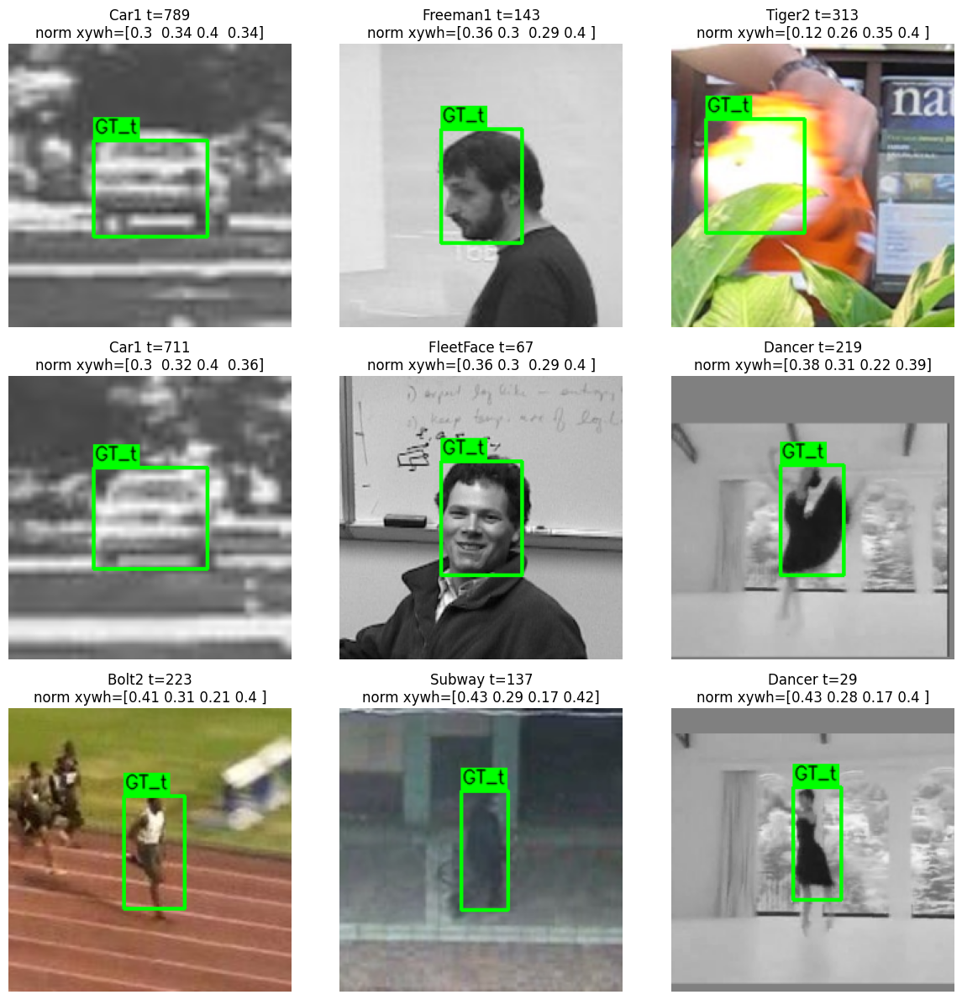

In [84]:
# =============================================================================
# VISUALIZATION — random training pairs: GT box drawn on the search crop
# =============================================================================
# If the green box looks wrong here, fix Part 2 before training!
# =============================================================================
def visualize_search_region_samples(num_samples: int = 6, scale: float = SEARCH_SCALE):
    """
    Pick random training (frame_t-1, frame_t) pairs, build the search crop
    around frame t-1's GT box, and overlay the *current* GT box (in green)
    using its mapped crop-local coordinates. This is the most important
    sanity check for the coordinate conversion functions.
    """
    rng = np.random.default_rng(SEED)

    samples = []
    attempts = 0
    while len(samples) < num_samples and attempts < num_samples * 20:
        attempts += 1
        seq_name = train_sequences[int(rng.integers(0, len(train_sequences)))]
        try:
            frames, gt = load_sequence_with_gt(DATA_ROOT / seq_name)
        except Exception:
            continue
        if len(frames) < 2:
            continue
        t = int(rng.integers(1, len(frames)))
        samples.append((seq_name, frames, gt, t))

    cols = 3
    rows = int(np.ceil(num_samples / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = np.atleast_2d(axes).reshape(-1)

    for ax, (seq_name, frames, gt, t) in zip(axes, samples):
        prev_bbox = gt[t - 1]
        curr_bbox = gt[t]

        image = read_image_rgb(frames[t])
        crop, info = crop_search_region(image, prev_bbox, scale=scale, output_size=IMAGE_SIZE)

        norm_curr = bbox_to_crop_coordinates(curr_bbox, info)
        # Map normalized crop-local box to 224x224 pixel coordinates.
        px = norm_curr * IMAGE_SIZE
        crop_with_box = draw_bbox(crop, px, color=(0, 255, 0), thickness=2, label="GT_t")
        ax.imshow(crop_with_box)
        ax.set_title(f"{seq_name} t={t}\nnorm xywh={np.round(norm_curr, 2)}")
        ax.axis("off")

    for ax in axes[len(samples):]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


visualize_search_region_samples(num_samples=9)

# PART 3 — CNN-Based Bounding-Box Regression Model

In this part, you will train a CNN to predict the target bounding box inside a search crop.

The model input is:

```text
224 × 224 RGB search crop
```

The model output is:

```text
x, y, width, height
```

The output must be crop-local and normalized to `[0, 1]`.

Do not train the model with full-frame coordinates.

## 3.1 Model Architecture Overview

Recommended architecture:

```text
Search Region Crop
        ↓
Preprocessing
        ↓
CNN Backbone
        ↓
Regression Head
        ↓
Normalized Bounding Box [x, y, w, h]
        ↓
Convert to full-frame coordinates during tracking
```

You may use an ImageNet-pretrained ResNet18 backbone. Replace its final classification layer with a regression layer that outputs four values.

## 3.2 PyTorch Dataset

Implement a PyTorch dataset that generates search-region samples from training sequences.

Each sample should contain:

```text
input: search crop from current frame
target: current target bbox in crop-local normalized coordinates
```

Use validation sequences similarly for crop-level validation.

In [85]:
# =============================================================================
# SearchRegionDataset — PyTorch Dataset for Part 3
# =============================================================================
# Each sample: frame t, crop around GT box at t-1, target = GT box at t in crop coords
# augment=True: flip, color jitter, jitter prev box (simulates tracking noise)
# =============================================================================
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)


class SearchRegionDataset(Dataset):
    """
    Per-sample format::

        input  : current frame search crop around previous GT bbox  (3, H, W)
        target : current GT bbox in crop-local normalized coords    (4,)

    When ``augment=True`` we apply training-only data augmentation:

      * random horizontal flip (target's x flipped accordingly),
      * mild color jitter on the crop,
      * jitter of the *previous* bbox center/size before cropping, which
        simulates the noisy previous predictions the tracker will see at
        test time (the single most important augmentation for this kind
        of crop-and-regress tracker),
      * jitter of the search-region scale, so the model is exposed to
        slightly larger / tighter crops than the default 2.5x crop,
      * optional ``sample_multiplier > 1`` to draw each base pair multiple
        times per epoch with different random jitters (more diversity
        per epoch at the cost of linearly more iterations).
    """

    def __init__(
        self,
        data_root: Path,
        sequence_names: List[str],
        image_size: int = IMAGE_SIZE,
        search_scale: float = SEARCH_SCALE,
        augment: bool = False,
        prev_jitter: float = 0.20,        # ↑ from 0.10 (bigger train/test gap fix)
        scale_jitter: float = 0.15,       # NEW: +/-15% scale jitter on crop_size
        sample_multiplier: int = 1,       # NEW: replicate each pair k times per epoch
    ):
        self.data_root = Path(data_root)
        self.sequence_names = list(sequence_names)
        self.image_size = image_size
        self.search_scale = search_scale
        self.augment = augment
        self.prev_jitter = prev_jitter
        self.scale_jitter = scale_jitter
        self.sample_multiplier = max(1, int(sample_multiplier))

        self.samples: List[Tuple[str, str, np.ndarray, np.ndarray, int]] = []

        for seq_name in self.sequence_names:
            seq_dir = self.data_root / seq_name
            try:
                frame_paths, gt = load_sequence_with_gt(seq_dir)
            except Exception as exc:
                print(f"[SearchRegionDataset] skipping {seq_name}: {exc}")
                continue
            for t in range(1, len(frame_paths)):
                base = (
                    seq_name,
                    str(frame_paths[t]),
                    gt[t - 1].astype(np.float64),
                    gt[t].astype(np.float64),
                    t,
                )
                for _ in range(self.sample_multiplier):
                    self.samples.append(base)

        # We resize *inside* crop_search_region, so the transform here only
        # converts to tensor and applies ImageNet normalization.
        self.normalize = transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
        self.color_jitter = transforms.ColorJitter(
            brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02
        ) if augment else None

    def __len__(self):
        return len(self.samples)

    # ------------------------------------------------------------------ #
    # Augmentation helpers                                                #
    # ------------------------------------------------------------------ #
    def _jitter_prev_bbox(self, prev_bbox: np.ndarray, rng: random.Random) -> np.ndarray:
        """Random small perturbation of prev_bbox to mimic tracker drift."""
        x, y, w, h = [float(v) for v in prev_bbox]
        cx, cy = x + w / 2.0, y + h / 2.0

        j = self.prev_jitter
        # Translate the center by up to ``j * size`` and scale w/h by up to (1 +/- j).
        cx += rng.uniform(-j, j) * w
        cy += rng.uniform(-j, j) * h
        w  *= rng.uniform(1.0 - j, 1.0 + j)
        h  *= rng.uniform(1.0 - j, 1.0 + j)
        w  = max(2.0, w)
        h  = max(2.0, h)
        return np.array([cx - w / 2.0, cy - h / 2.0, w, h], dtype=np.float64)

    def __getitem__(self, idx: int):
        seq_name, frame_path, prev_bbox, curr_bbox, t = self.samples[idx]
        image = read_image_rgb(Path(frame_path))

        prev_for_crop = prev_bbox
        sample_scale = self.search_scale
        if self.augment:
            rng = random.Random(idx + (1 << 20))
            prev_for_crop = self._jitter_prev_bbox(prev_bbox, rng)
            # Scale jitter: sample crop_size from (1 +/- scale_jitter) * SEARCH_SCALE
            sj = self.scale_jitter
            sample_scale = self.search_scale * rng.uniform(1.0 - sj, 1.0 + sj)

        crop, info = crop_search_region(
            image, prev_for_crop, scale=sample_scale, output_size=self.image_size
        )
        target = bbox_to_crop_coordinates(curr_bbox, info)  # (4,) ~[0, 1]

        # ---- augmentation that affects both image and target ---- #
        crop_aug = crop
        if self.augment:
            # Color jitter (apply to a PIL image, then back to ndarray).
            from PIL import Image
            pil = Image.fromarray(crop_aug)
            pil = self.color_jitter(pil)
            crop_aug = np.array(pil)

            # Horizontal flip 50% of the time.
            if random.Random(idx ^ 0x9E3779B1).random() < 0.5:
                crop_aug = np.ascontiguousarray(crop_aug[:, ::-1, :])
                # Flip x: new_x = 1 - (x + w)
                target = np.array([
                    1.0 - (target[0] + target[2]),
                    target[1],
                    target[2],
                    target[3],
                ], dtype=np.float64)

        # ---- to tensor + normalize ---- #
        tensor = torch.from_numpy(crop_aug).permute(2, 0, 1).contiguous().float() / 255.0
        tensor = self.normalize(tensor)
        target_tensor = torch.from_numpy(target.astype(np.float32))

        return tensor, target_tensor

## 3.3 DataLoaders

Create train and validation DataLoaders.

Training samples should come only from the training split. Validation samples should come only from the validation split.

In [86]:
# =============================================================================
# DataLoaders — batch training/val crops (shuffle train only)
# =============================================================================
def create_dataloaders(
    data_root: Path,
    train_sequences: List[str],
    val_sequences: List[str],
    batch_size: int = BATCH_SIZE,
    image_size: int = IMAGE_SIZE,
    search_scale: float = SEARCH_SCALE,
    augment_train: bool = True,
    num_workers: int = NUM_WORKERS,
) -> Tuple[DataLoader, DataLoader, SearchRegionDataset, SearchRegionDataset]:
    """Build training and validation datasets / dataloaders."""
    train_dataset = SearchRegionDataset(
        data_root=data_root,
        sequence_names=train_sequences,
        image_size=image_size,
        search_scale=search_scale,
        augment=augment_train,
    )
    val_dataset = SearchRegionDataset(
        data_root=data_root,
        sequence_names=val_sequences,
        image_size=image_size,
        search_scale=search_scale,
        augment=False,
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=torch.cuda.is_available(),
        drop_last=True,
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=torch.cuda.is_available(),
        drop_last=False,
    )
    return train_loader, val_loader, train_dataset, val_dataset


train_loader, val_loader, train_dataset, val_dataset = create_dataloaders(
    DATA_ROOT,
    train_sequences,
    val_sequences,
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    search_scale=SEARCH_SCALE,
    augment_train=True,
)
print(f"train_dataset: {len(train_dataset)} samples")
print(f"val_dataset  : {len(val_dataset)} samples")

train_dataset: 26548 samples
val_dataset  : 5041 samples


## 3.4 Model Definition

Define your CNN-based bounding-box regressor.

Recommended design:
- pretrained ResNet18 backbone,
- final regression layer with 4 outputs,
- output activation to keep predictions in `[0, 1]`.

In [87]:
# =============================================================================
# TrackingRegressor — ResNet18 + 4 outputs + sigmoid -> [0,1] box in crop
# =============================================================================
class TrackingRegressor(nn.Module):
    """
    ResNet18 backbone (optionally ImageNet-pretrained) with the final FC
    layer replaced by a 4-output regression head. ``forward`` applies a
    sigmoid so predictions are always in ``[0, 1]``.
    """

    def __init__(self, pretrained: bool = True):
        super().__init__()
        if pretrained:
            try:
                weights = torchvision.models.ResNet18_Weights.IMAGENET1K_V1
                backbone = torchvision.models.resnet18(weights=weights)
            except (AttributeError, TypeError):
                # Fallback for older torchvision versions.
                backbone = torchvision.models.resnet18(pretrained=True)
        else:
            backbone = torchvision.models.resnet18(weights=None)

        in_features = backbone.fc.in_features
        backbone.fc = nn.Linear(in_features, 4)
        self.net = backbone

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return torch.sigmoid(self.net(x))


def create_model() -> nn.Module:
    model = TrackingRegressor(pretrained=True).to(DEVICE)
    return model


model = create_model()
n_params = sum(p.numel() for p in model.parameters())
n_train = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"TrackingRegressor: {n_params:,} parameters ({n_train:,} trainable)")

TrackingRegressor: 11,178,564 parameters (11,178,564 trainable)


## 3.5 IoU for Crop-Level Validation

Implement IoU calculation for boxes in `(x, y, w, h)` format.

This function will be used both for crop-level validation and sequence-level evaluation.

In [88]:
# =============================================================================
# IoU helpers — used for crop-level val and sequence-level evaluation (Part 5)
# =============================================================================
def compute_iou_np(box_a: np.ndarray, box_b: np.ndarray) -> float:
    """
    IoU between two ``(x, y, w, h)`` boxes.

    Width/height are clamped to ``>= 0`` only when computing areas. We do not
    clamp the crop-local boxes to ``[0, 1]`` -- a target whose true box is
    partially outside the crop should still produce a meaningful IoU.
    """
    a = np.asarray(box_a, dtype=np.float64).reshape(4)
    b = np.asarray(box_b, dtype=np.float64).reshape(4)

    aw, ah = max(a[2], 0.0), max(a[3], 0.0)
    bw, bh = max(b[2], 0.0), max(b[3], 0.0)
    if aw <= 0 or ah <= 0 or bw <= 0 or bh <= 0:
        return 0.0

    ax2, ay2 = a[0] + aw, a[1] + ah
    bx2, by2 = b[0] + bw, b[1] + bh

    inter_x1 = max(a[0], b[0])
    inter_y1 = max(a[1], b[1])
    inter_x2 = min(ax2,   bx2)
    inter_y2 = min(ay2,   by2)

    inter_w = max(0.0, inter_x2 - inter_x1)
    inter_h = max(0.0, inter_y2 - inter_y1)
    inter   = inter_w * inter_h

    union = aw * ah + bw * bh - inter
    if union <= 0.0:
        return 0.0
    return float(inter / union)


def mean_iou_batch(preds: torch.Tensor, targets: torch.Tensor) -> float:
    """Mean IoU over a batch of crop-local boxes."""
    preds_np = preds.detach().cpu().numpy()
    targets_np = targets.detach().cpu().numpy()
    ious = [compute_iou_np(p, t) for p, t in zip(preds_np, targets_np)]
    return float(np.mean(ious)) if ious else 0.0


def compute_giou_loss_torch(pred: torch.Tensor, target: torch.Tensor, eps: float = 1e-7) -> torch.Tensor:
    """Generalized IoU loss for boxes in normalized (x, y, w, h) format.

    Both ``pred`` and ``target`` are tensors of shape (B, 4) with x, y, w, h
    in the *same* coordinate system (here: crop-local [0, 1]). Returns
    a scalar loss = mean(1 - GIoU) over the batch.

    GIoU adds a term that penalizes the smallest enclosing box, so the
    gradient is informative even when the boxes do not overlap (unlike IoU
    which is 0 with zero gradient). This complements Smooth L1 — L1 says
    'move toward target', GIoU says 'overlap target'.
    """
    # Ensure positive sizes (clamp to small epsilon to keep gradients).
    pw = pred[:, 2].clamp(min=eps)
    ph = pred[:, 3].clamp(min=eps)
    tw = target[:, 2].clamp(min=eps)
    th = target[:, 3].clamp(min=eps)

    px1, py1 = pred[:, 0], pred[:, 1]
    px2, py2 = px1 + pw, py1 + ph
    tx1, ty1 = target[:, 0], target[:, 1]
    tx2, ty2 = tx1 + tw, ty1 + th

    # Intersection.
    ix1 = torch.maximum(px1, tx1)
    iy1 = torch.maximum(py1, ty1)
    ix2 = torch.minimum(px2, tx2)
    iy2 = torch.minimum(py2, ty2)
    iw = (ix2 - ix1).clamp(min=0.0)
    ih = (iy2 - iy1).clamp(min=0.0)
    inter = iw * ih

    union = pw * ph + tw * th - inter + eps
    iou = inter / union

    # Smallest enclosing box.
    cx1 = torch.minimum(px1, tx1)
    cy1 = torch.minimum(py1, ty1)
    cx2 = torch.maximum(px2, tx2)
    cy2 = torch.maximum(py2, ty2)
    enclose_area = (cx2 - cx1).clamp(min=0.0) * (cy2 - cy1).clamp(min=0.0) + eps

    giou = iou - (enclose_area - union) / enclose_area
    return (1.0 - giou).mean()


## 3.6 Training and Validation Loops

Use a regression loss such as Smooth L1 loss.

During training, update model parameters.  
During validation, do not update model parameters.

Record:
- training loss,
- validation loss,
- validation crop-level mean IoU.

In [89]:
# Training loop.
# I use a weighted sum of Smooth L1 and (1 - GIoU) as the loss. With
# Smooth L1 alone the boxes converged too slowly when the target was far
# from the crop center, so adding the GIoU term that directly rewards
# overlap helped. The best checkpoint is picked by the tracking IoU on a
# small subset of validation sequences instead of the crop IoU, because
# the crop IoU was always much higher than the actual tracking IoU.
SMOOTH_L1_WEIGHT = 1.0
GIOU_WEIGHT      = 2.0


def combined_loss(preds: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
    smooth = nn.functional.smooth_l1_loss(preds, targets, beta=1.0)
    giou   = compute_giou_loss_torch(preds, targets)
    return SMOOTH_L1_WEIGHT * smooth + GIOU_WEIGHT * giou


def train_one_epoch(model, loader, optimizer, criterion, device) -> float:
    """Train ``model`` for one epoch; return the average training loss."""
    model.train()
    running = 0.0
    n = 0
    for crops, targets in loader:
        crops = crops.to(device, non_blocking=True)
        targets = targets.to(device, non_blocking=True)

        optimizer.zero_grad()
        preds = model(crops)
        loss = criterion(preds, targets)
        loss.backward()
        optimizer.step()

        bs = crops.size(0)
        running += loss.item() * bs
        n += bs
    return running / max(n, 1)


@torch.no_grad()
def validate_model(model, loader, criterion, device) -> Dict[str, float]:
    """Validate ``model`` and return loss + crop-level mean IoU."""
    model.eval()
    running = 0.0
    n = 0
    iou_sum = 0.0
    for crops, targets in loader:
        crops = crops.to(device, non_blocking=True)
        targets = targets.to(device, non_blocking=True)
        preds = model(crops)

        loss = criterion(preds, targets)
        bs = crops.size(0)
        running += loss.item() * bs
        n += bs

        preds_np = preds.detach().cpu().numpy()
        targets_np = targets.detach().cpu().numpy()
        for p, t in zip(preds_np, targets_np):
            iou_sum += compute_iou_np(p, t)

    return {
        "val_loss":     running / max(n, 1),
        "val_mean_iou": iou_sum / max(n, 1),
    }


# This eval is intentionally SELF-CONTAINED — it only uses helpers from
# Parts 1–3 (crop_search_region, crop_to_frame_coordinates, clip_bbox_to_image,
# read_image_rgb, compute_iou_np). It does NOT depend on Part 4 / 5 cells
# (track_sequence, evaluate_sequence), so it works the first time you run the
# notebook top-to-bottom.
_QUICK_EVAL_TRANSFORM = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])


@torch.no_grad()
def quick_track_eval(model, sequence_names, data_root=None, device=None, scale=None) -> Dict[str, float]:
    """Run a self-contained tracking pass on a few validation sequences.

    Returns the mean per-sequence IoU and average center error — the metric
    we actually care about (captures drift, unlike crop-level IoU). The loop
    is inlined (no dependency on Part 4 / Part 5 functions) so it works the
    first time the notebook is run top-to-bottom.
    """
    if data_root is None:
        data_root = DATA_ROOT
    if device is None:
        device = DEVICE
    if scale is None:
        scale = SEARCH_SCALE

    model.eval()
    ious, cerrs = [], []

    for seq_name in sequence_names:
        try:
            frames, gt = load_sequence_with_gt(Path(data_root) / seq_name)
        except Exception as exc:
            print(f"  [quick-track] skip {seq_name}: {exc}")
            continue

        n = len(frames)
        if n < 2:
            continue
        preds = np.zeros((n, 4), dtype=np.float64)
        preds[0] = np.asarray(gt[0], dtype=np.float64)

        for t in range(1, n):
            prev = preds[t - 1]
            image = read_image_rgb(frames[t])
            crop, info = crop_search_region(image, prev, scale=scale, output_size=IMAGE_SIZE)

            tensor = _QUICK_EVAL_TRANSFORM(crop).unsqueeze(0).to(device)
            norm_pred = model(tensor)[0].cpu().numpy().astype(np.float64)
            full_pred = crop_to_frame_coordinates(norm_pred, info)

            # Same safety net as the full track_sequence helper below.
            if full_pred[2] <= 1.0 or full_pred[3] <= 1.0:
                full_pred = prev.copy()

            # Inline motion clamp (mirrors _apply_motion_clamp in Part 4).
            if MOTION_CLAMP and MOTION_CLAMP > 0:
                pcx = full_pred[0] + full_pred[2] / 2.0
                pcy = full_pred[1] + full_pred[3] / 2.0
                qcx = prev[0] + prev[2] / 2.0
                qcy = prev[1] + prev[3] / 2.0
                max_dx = MOTION_CLAMP * max(prev[2], 1.0)
                max_dy = MOTION_CLAMP * max(prev[3], 1.0)
                dx = float(np.clip(pcx - qcx, -max_dx, max_dx))
                dy = float(np.clip(pcy - qcy, -max_dy, max_dy))
                new_cx, new_cy = qcx + dx, qcy + dy
                full_pred = np.array(
                    [new_cx - full_pred[2] / 2.0,
                     new_cy - full_pred[3] / 2.0,
                     full_pred[2],
                     full_pred[3]],
                    dtype=np.float64,
                )

            full_pred = clip_bbox_to_image(full_pred, image.shape)
            preds[t] = full_pred

        # Inline IoU + center error (no dependency on Part 5).
        seq_ious = np.array([compute_iou_np(preds[i], gt[i]) for i in range(n)])
        seq_cerrs = np.array([
            math.hypot(
                (preds[i, 0] + preds[i, 2] / 2.0) - (gt[i, 0] + gt[i, 2] / 2.0),
                (preds[i, 1] + preds[i, 3] / 2.0) - (gt[i, 1] + gt[i, 3] / 2.0),
            )
            for i in range(n)
        ])
        ious.append(float(np.mean(seq_ious)))
        cerrs.append(float(np.mean(seq_cerrs)))

    return {
        "track_mean_iou":         float(np.mean(ious)) if ious else 0.0,
        "track_avg_center_error": float(np.mean(cerrs)) if cerrs else float("inf"),
        "num_seqs":               len(ious),
    }


def train_model(
    model,
    train_loader,
    val_loader,
    num_epochs: int = NUM_EPOCHS,
    lr: float = LEARNING_RATE,
    weight_decay: float = WEIGHT_DECAY,
    device: torch.device = DEVICE,
    checkpoint_path: Path = CHECKPOINT_ROOT / "best.pt",
    use_scheduler: bool = True,
    track_eval_seqs: Optional[List[str]] = None,
) -> Dict[str, list]:
    """Full training loop with combined loss, weight decay, and tracking eval."""
    criterion = combined_loss
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = (
        torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
        if use_scheduler else None
    )

    history = {
        "train_loss":     [],
        "val_loss":       [],
        "val_mean_iou":   [],  # crop-level (cheap)
        "track_mean_iou": [],  # sequence-level (the real metric)
        "lr":             [],
    }
    best_metric = -1.0
    best_epoch = -1

    Path(checkpoint_path).parent.mkdir(parents=True, exist_ok=True)

    for epoch in range(1, num_epochs + 1):
        t0 = time.time()
        train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
        val_metrics = validate_model(model, val_loader, criterion, device)
        if scheduler is not None:
            scheduler.step()

        if track_eval_seqs:
            tk = quick_track_eval(model, track_eval_seqs, device=device)
            track_iou = tk["track_mean_iou"]
        else:
            track_iou = val_metrics["val_mean_iou"]

        cur_lr = optimizer.param_groups[0]["lr"]
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_metrics["val_loss"])
        history["val_mean_iou"].append(val_metrics["val_mean_iou"])
        history["track_mean_iou"].append(track_iou)
        history["lr"].append(cur_lr)

        improved = track_iou > best_metric
        if improved:
            best_metric = track_iou
            best_epoch = epoch
            torch.save({
                "model_state_dict": model.state_dict(),
                "epoch": epoch,
                "val_mean_iou": val_metrics["val_mean_iou"],
                "track_mean_iou": track_iou,
                "config": {
                    "image_size":   IMAGE_SIZE,
                    "search_scale": SEARCH_SCALE,
                    "lr":           lr,
                    "weight_decay": weight_decay,
                },
            }, checkpoint_path)

        dt = time.time() - t0
        flag = " *best*" if improved else ""
        print(
            f"epoch {epoch:02d}/{num_epochs:02d} | "
            f"train_loss={train_loss:.4f} | "
            f"val_loss={val_metrics['val_loss']:.4f} | "
            f"val_crop_iou={val_metrics['val_mean_iou']:.4f} | "
            f"track_iou={track_iou:.4f} | "
            f"lr={cur_lr:.2e} | {dt:.1f}s{flag}"
        )

    print(f"Best by track_iou={best_metric:.4f} at epoch {best_epoch} -> saved to {checkpoint_path}")
    return history


## 3.7 Train the Model

Train your model using the training split and monitor performance on the validation split.

Save the best model according to validation performance.

In [90]:
# =============================================================================
# TRAIN — 15 epochs; best weights -> checkpoint/best.pt
# =============================================================================
history = train_model(
    model,
    train_loader,
    val_loader,
    num_epochs=NUM_EPOCHS,
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY,
    device=DEVICE,
    checkpoint_path=CHECKPOINT_ROOT / "best.pt",
    use_scheduler=True,
    track_eval_seqs=QUICK_TRACK_VAL_SEQS,   # picks best by REAL tracking IoU
)

# Reload the best checkpoint into ``model`` so subsequent cells use it.
_best_ckpt = torch.load(CHECKPOINT_ROOT / "best.pt", map_location=DEVICE)
model.load_state_dict(_best_ckpt["model_state_dict"])
print(f"Loaded best model from epoch {_best_ckpt['epoch']} "
      f"(val_mean_iou={_best_ckpt['val_mean_iou']:.4f}).")

epoch 01/15 | train_loss=0.7866 | val_loss=0.7779 | val_crop_iou=0.6361 | track_iou=0.3662 | lr=4.95e-05 | 227.5s *best*
epoch 02/15 | train_loss=0.4621 | val_loss=0.7806 | val_crop_iou=0.6324 | track_iou=0.4738 | lr=4.78e-05 | 218.7s *best*
epoch 03/15 | train_loss=0.3750 | val_loss=0.8143 | val_crop_iou=0.6177 | track_iou=0.4805 | lr=4.52e-05 | 214.7s *best*
epoch 04/15 | train_loss=0.3281 | val_loss=0.8158 | val_crop_iou=0.6153 | track_iou=0.4693 | lr=4.17e-05 | 215.6s
epoch 05/15 | train_loss=0.2970 | val_loss=0.8320 | val_crop_iou=0.6086 | track_iou=0.2870 | lr=3.75e-05 | 214.2s
epoch 06/15 | train_loss=0.2685 | val_loss=0.8066 | val_crop_iou=0.6202 | track_iou=0.4897 | lr=3.27e-05 | 214.8s *best*
epoch 07/15 | train_loss=0.2471 | val_loss=0.8188 | val_crop_iou=0.6144 | track_iou=0.4150 | lr=2.76e-05 | 218.5s
epoch 08/15 | train_loss=0.2301 | val_loss=0.7996 | val_crop_iou=0.6229 | track_iou=0.4124 | lr=2.24e-05 | 218.1s
epoch 09/15 | train_loss=0.2112 | val_loss=0.8053 | val_crop

## 3.8 Training Curves

Plot:
- training loss,
- validation loss,
- validation crop-level mean IoU.

Briefly comment on whether the model appears to learn.

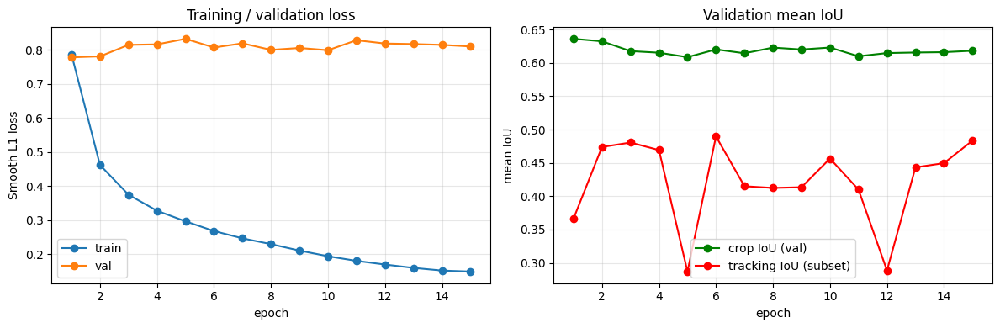

In [91]:
# =============================================================================
# Plot loss and val crop IoU curves
# =============================================================================
def plot_training_curves(history: Dict[str, list], save_path: Optional[Path] = None):
    """Plot train/val loss and validation crop-level mean IoU."""
    epochs = list(range(1, len(history["train_loss"]) + 1))

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(epochs, history["train_loss"], "-o", label="train")
    axes[0].plot(epochs, history["val_loss"],   "-o", label="val")
    axes[0].set_xlabel("epoch"); axes[0].set_ylabel("Smooth L1 loss")
    axes[0].set_title("Training / validation loss")
    axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(epochs, history["val_mean_iou"], "-o", color="green", label="crop IoU (val)")
    if "track_mean_iou" in history and any(v != 0 for v in history["track_mean_iou"]):
        axes[1].plot(epochs, history["track_mean_iou"], "-o", color="red",
                     label="tracking IoU (subset)")
    axes[1].set_xlabel("epoch"); axes[1].set_ylabel("mean IoU")
    axes[1].set_title("Validation mean IoU")
    axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()


plot_training_curves(history, save_path=OUTPUT_ROOT / "training_curves.png")

## 3.9 Visualize Crop-Level Validation Predictions

Visualize at least five validation crop predictions.

Draw:
- ground-truth box,
- predicted box.

This helps check whether the model learned meaningful localization.

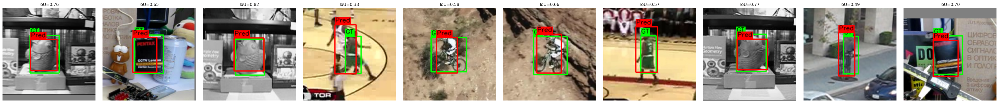

In [92]:
# =============================================================================
# Visualize predictions on validation crops (green=GT, red=pred)
# =============================================================================
def denormalize_tensor_image(tensor_img: torch.Tensor) -> np.ndarray:
    """Inverse of ImageNet normalization. Returns a uint8 ``(H, W, 3)`` ndarray."""
    mean = torch.tensor(IMAGENET_MEAN, device=tensor_img.device).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD,  device=tensor_img.device).view(3, 1, 1)
    img = tensor_img * std + mean
    img = img.clamp(0.0, 1.0).detach().cpu().numpy()
    img = np.transpose(img, (1, 2, 0))
    return (img * 255.0).astype(np.uint8)


@torch.no_grad()
def visualize_validation_predictions(model, dataset, num_samples: int = 5, seed: int = SEED):
    """Show ``num_samples`` validation crops with GT (green) and predicted (red) boxes."""
    model.eval()
    rng = np.random.default_rng(seed)
    if len(dataset) == 0:
        print("Validation dataset is empty.")
        return
    indices = rng.choice(len(dataset), size=min(num_samples, len(dataset)), replace=False)

    crops, targets = zip(*(dataset[int(i)] for i in indices))
    crops_batch = torch.stack(crops, dim=0).to(DEVICE)
    targets_batch = torch.stack(targets, dim=0).cpu().numpy()
    preds = model(crops_batch).cpu().numpy()

    cols = num_samples
    fig, axes = plt.subplots(1, cols, figsize=(4 * cols, 4))
    if cols == 1:
        axes = [axes]
    for ax, crop_t, gt_norm, pred_norm in zip(axes, crops, targets_batch, preds):
        crop_img = denormalize_tensor_image(crop_t)
        size = crop_img.shape[0]

        gt_px   = gt_norm   * size
        pred_px = pred_norm * size

        crop_with_boxes = draw_bbox(crop_img, gt_px,   color=(0, 255, 0), thickness=2, label="GT")
        crop_with_boxes = draw_bbox(crop_with_boxes, pred_px, color=(255, 0, 0), thickness=2, label="Pred")

        iou = compute_iou_np(gt_norm, pred_norm)
        ax.imshow(crop_with_boxes)
        ax.set_title(f"IoU={iou:.2f}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


visualize_validation_predictions(model, val_dataset, num_samples=10)

# PART 4 — Single-Object Tracking on Validation and Test Sequences

After training the model, use it as a tracker.

For validation sequences:
- use the first line of `groundtruth_rect.txt` as initialization,
- predict all later frames,
- evaluate after tracking.

For test sequences:
- use `init_rect.txt` as initialization,
- predict all later frames,
- save CSV files,
- do not evaluate locally.

## 4.1 Evaluation-Time Preprocessing

Use the same preprocessing during tracking that you used during training.

Do not apply random augmentation during validation or test tracking.

In [93]:
# =============================================================================
# eval_transform — same preprocessing as training (no random augmentation)
# =============================================================================
eval_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

## 4.2 Predict a Box Inside One Crop

This helper runs the model on one search crop and returns a normalized crop-local bounding box.

In [94]:
# =============================================================================
# predict_bbox_in_crop — single forward pass on one 224x224 RGB crop
# =============================================================================
@torch.no_grad()
def predict_bbox_in_crop(model, crop_rgb: np.ndarray, device: torch.device = DEVICE) -> np.ndarray:
    """
    Run ``model`` on a single RGB crop and return a normalized ``(x, y, w, h)``
    bbox in ``[0, 1]`` (crop-local coordinates).
    """
    model.eval()
    tensor = eval_transform(crop_rgb).unsqueeze(0).to(device)
    pred = model(tensor)[0].cpu().numpy().astype(np.float64)
    return pred

## 4.3 Tracking Loop

Implement the full single-object tracking loop.

The function should receive only:

```text
model
frame paths
initial bbox
```

It must not receive the full ground-truth array.

In [95]:
# Part 4 tracking loop. After the initial frame the tracker never looks
# at the ground truth again. Two small extras compared to the plain
# version:
#   * A motion clamp that caps how far the center of the box can move
#     between two frames (as a fraction of the previous box size). This
#     stops the box from jumping to the other side of the frame when the
#     model gives a noisy prediction.
#   * If the predicted width or height collapses to ~0, I fall back to
#     the previous box so the next search crop still makes sense.
def _apply_motion_clamp(pred: np.ndarray, prev: np.ndarray, clamp_frac: float) -> np.ndarray:
    """Limit per-frame center shift to ``clamp_frac`` of the previous box size."""
    if clamp_frac is None or clamp_frac <= 0:
        return pred
    px, py, pw, ph = [float(v) for v in pred]
    qx, qy, qw, qh = [float(v) for v in prev]

    pcx, pcy = px + pw / 2.0, py + ph / 2.0
    qcx, qcy = qx + qw / 2.0, qy + qh / 2.0
    dx, dy = pcx - qcx, pcy - qcy

    max_dx = clamp_frac * max(qw, 1.0)
    max_dy = clamp_frac * max(qh, 1.0)
    dx = float(np.clip(dx, -max_dx, max_dx))
    dy = float(np.clip(dy, -max_dy, max_dy))

    new_cx = qcx + dx
    new_cy = qcy + dy
    return np.array([new_cx - pw / 2.0, new_cy - ph / 2.0, pw, ph], dtype=np.float64)


@torch.no_grad()
def track_sequence(
    model,
    frame_paths: List[Path],
    initial_bbox: np.ndarray,
    device: torch.device = DEVICE,
    scale: float = SEARCH_SCALE,
    image_size: int = IMAGE_SIZE,
    motion_clamp: float = MOTION_CLAMP,
) -> np.ndarray:
    """
    Run the tracker on ``frame_paths`` starting from ``initial_bbox``.

    Pipeline per frame (t >= 1):
        1. Build a search crop around the *previous prediction* (never GT).
        2. Run the model on the crop -> normalized bbox in [0, 1].
        3. Map back to full-frame coordinates.
        4. Clamp the per-frame center jump to a fraction of the previous size
           (anti-drift; disable by passing motion_clamp=0).
        5. Clip the result to image boundaries.

    No ground truth is consulted after frame 0.
    """
    model.eval()
    n = len(frame_paths)
    predictions = np.zeros((n, 4), dtype=np.float64)
    predictions[0] = np.asarray(initial_bbox, dtype=np.float64)

    if n == 1:
        return predictions

    for t in range(1, n):
        prev = predictions[t - 1]  # NOT ground truth — this is what makes tracking hard
        image = read_image_rgb(Path(frame_paths[t]))
        crop, info = crop_search_region(image, prev, scale=scale, output_size=image_size)
        norm_pred = predict_bbox_in_crop(model, crop, device=device)  # in [0,1] crop coords
        full_pred = crop_to_frame_coordinates(norm_pred, info)        # back to full image pixels

        # Degenerate guard.
        if full_pred[2] <= 1.0 or full_pred[3] <= 1.0:
            full_pred = prev.copy()

        full_pred = _apply_motion_clamp(full_pred, prev, motion_clamp)
        full_pred = clip_bbox_to_image(full_pred, image.shape)
        predictions[t] = full_pred

    return predictions


## 4.4 Save Prediction CSV Files

Save predictions in the required format.

The saved coordinates must be full-frame pixel coordinates.

In [96]:
# =============================================================================
# save_predictions_csv — required submission format: frame,x,y,w,h
# =============================================================================
def save_predictions_csv(predictions: np.ndarray, output_path: Path):
    """
    Save predictions to CSV with header ``frame,x,y,w,h``.

    Frame numbering starts at 1 and matches the order of frames in the
    sequence's ``img/`` folder. Coordinates are full-frame pixel values.
    """
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    predictions = np.asarray(predictions, dtype=np.float64)
    if predictions.ndim != 2 or predictions.shape[1] != 4:
        raise ValueError(f"predictions must have shape (N, 4); got {predictions.shape}")

    with open(output_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["frame", "x", "y", "w", "h"])
        for i, (x, y, w, h) in enumerate(predictions, start=1):
            writer.writerow([
                i,
                f"{x:.4f}",
                f"{y:.4f}",
                f"{w:.4f}",
                f"{h:.4f}",
            ])

## 4.5 Run Tracking on Validation Sequences

Use the first validation ground-truth box for initialization.

Save validation predictions under:

```text
outputs/validation/
```

In [97]:
# =============================================================================
# run_tracking_on_validation_sequences — save outputs/validation/*.csv
# =============================================================================
def run_tracking_on_validation_sequences(
    model,
    data_root: Path,
    sequence_names: List[str],
    output_root: Path,
    device: torch.device = DEVICE,
    scale: float = SEARCH_SCALE,
) -> Dict[str, np.ndarray]:
    """
    Track each validation sequence using only ``gt_bboxes[0]`` as initialization.
    Saves ``output_root/validation/<seq>_predictions.csv`` and returns a dict
    of per-sequence prediction arrays for downstream evaluation.
    """
    out_dir = Path(output_root) / "validation"
    out_dir.mkdir(parents=True, exist_ok=True)
    results: Dict[str, np.ndarray] = {}

    for seq_name in sequence_names:
        seq_dir = Path(data_root) / seq_name
        frame_paths, gt_bboxes = load_sequence_with_gt(seq_dir)
        initial_bbox = gt_bboxes[0]

        t0 = time.time()
        preds = track_sequence(
            model, frame_paths, initial_bbox,
            device=device, scale=scale, image_size=IMAGE_SIZE,
        )
        save_predictions_csv(preds, out_dir / f"{seq_name}_predictions.csv")

        dt = time.time() - t0
        fps = len(frame_paths) / max(dt, 1e-6)
        print(f"  [val ] {seq_name:>15s}: {len(frame_paths):4d} frames in {dt:5.1f}s ({fps:5.1f} fps)")
        results[seq_name] = preds

    return results

## 4.6 Run Tracking on Test Sequences

Use `init_rect.txt` for initialization.

Save test predictions under:

```text
outputs/test/
```

These files will be submitted for evaluation.

In [98]:
# =============================================================================
# run_tracking_on_test_sequences — save outputs/test/*.csv (SUBMIT THESE)
# =============================================================================
def run_tracking_on_test_sequences(
    model,
    data_root: Path,
    sequence_names: List[str],
    output_root: Path,
    device: torch.device = DEVICE,
    scale: float = SEARCH_SCALE,
) -> Dict[str, np.ndarray]:
    """
    Track each test sequence using only ``init_rect.txt`` as initialization
    and save ``output_root/test/<seq>_predictions.csv``.
    """
    out_dir = Path(output_root) / "test"
    out_dir.mkdir(parents=True, exist_ok=True)
    results: Dict[str, np.ndarray] = {}

    for seq_name in sequence_names:
        seq_dir = Path(data_root) / seq_name
        frame_paths, initial_bbox = load_test_sequence(seq_dir)

        t0 = time.time()
        preds = track_sequence(
            model, frame_paths, initial_bbox,
            device=device, scale=scale, image_size=IMAGE_SIZE,
        )
        save_predictions_csv(preds, out_dir / f"{seq_name}_predictions.csv")

        dt = time.time() - t0
        fps = len(frame_paths) / max(dt, 1e-6)
        print(f"  [test] {seq_name:>15s}: {len(frame_paths):4d} frames in {dt:5.1f}s ({fps:5.1f} fps)")
        results[seq_name] = preds

    return results

## 4.7 Execute Tracking

Run tracking on validation and test sequences.

Make sure the generated test CSV files are complete and correctly formatted.

In [99]:
# =============================================================================
# RUN TRACKING on all val + test sequences
# =============================================================================
print("Tracking validation sequences ...")
val_predictions = run_tracking_on_validation_sequences(
    model, DATA_ROOT, val_sequences, OUTPUT_ROOT,
    device=DEVICE, scale=SEARCH_SCALE,
)

print("\nTracking test sequences ...")
test_predictions = run_tracking_on_test_sequences(
    model, DATA_ROOT, test_sequences, OUTPUT_ROOT,
    device=DEVICE, scale=SEARCH_SCALE,
)

# Sanity-check: each saved CSV has the same row count as its sequence's
# frame count. This catches accidental off-by-one bugs early.
def _verify_csv_row_counts():
    for split, names, loader in [
        ("validation", val_sequences,  load_sequence_with_gt),
        ("test",       test_sequences, load_test_sequence),
    ]:
        for seq in names:
            csv_path = OUTPUT_ROOT / split / f"{seq}_predictions.csv"
            df = pd.read_csv(csv_path)
            frame_paths, _ = loader(DATA_ROOT / seq)
            assert len(df) == len(frame_paths), (
                f"{csv_path}: {len(df)} rows vs {len(frame_paths)} frames"
            )
            assert list(df.columns) == ["frame", "x", "y", "w", "h"], (
                f"{csv_path}: bad header {list(df.columns)}"
            )
            assert int(df["frame"].iloc[0]) == 1, f"{csv_path}: frame index must start at 1"
    print("CSV row counts and headers look correct.")


_verify_csv_row_counts()

Tracking validation sequences ...
  [val ]           Bird2:   99 frames in   0.7s (148.3 fps)
  [val ]            Fish:  476 frames in   2.8s (173.0 fps)
  [val ]          Human4:  667 frames in   5.5s (121.4 fps)
  [val ]         ClifBar:  472 frames in   2.4s (196.3 fps)
  [val ]            Bolt:  350 frames in   3.1s (111.8 fps)
  [val ]    MountainBike:  228 frames in   1.4s (157.9 fps)
  [val ]         CarDark:  393 frames in   2.3s (169.1 fps)
  [val ]             Man:  134 frames in   0.8s (161.2 fps)
  [val ]      Basketball:  725 frames in   5.2s (138.4 fps)
  [val ]          Crowds:  347 frames in   2.3s (149.5 fps)
  [val ]             Box: 1161 frames in   9.2s (126.4 fps)

Tracking test sequences ...
  [test]        TestSeq1: 1345 frames in   6.3s (213.0 fps)
  [test]        TestSeq2:  354 frames in   2.3s (154.3 fps)
  [test]        TestSeq3:  812 frames in   4.8s (170.0 fps)
  [test]        TestSeq4:  597 frames in   3.1s (190.5 fps)
  [test]        TestSeq5:  493 frames

# Required Test Output Format

For each test sequence, save one CSV file:

```text
outputs/test/<sequence_name>_predictions.csv
```

Each CSV file must contain:

```text
frame,x,y,w,h
```

Rules:

1. Number of rows must equal the number of frames.
2. Frame numbering must start from 1.
3. The first-frame prediction should be the initialization box from `init_rect.txt`.
4. Coordinates must be full-frame pixel coordinates.
5. Do not save normalized crop coordinates.
6. Bounding boxes must be in `(x, y, width, height)` format.

# PART 5 — Validation Evaluation and Analysis

Evaluate your tracker on validation sequences using the provided validation ground truth.

Do not evaluate test sequences. Test ground truth is hidden and will be evaluated by the instructors.

Required validation metrics:

1. Mean IoU  
2. Success Rate @ IoU ≥ 0.5  
3. Average Center Error  
4. Failure Count, where failure means IoU < 0.1

## 5.1 Metric Functions

Implement IoU, center error, and sequence-level evaluation.

In [100]:
# =============================================================================
# Part 5 metrics — IoU, center error, per-sequence evaluation
# =============================================================================
def compute_iou(box_a: np.ndarray, box_b: np.ndarray) -> float:
    """IoU between two ``(x, y, w, h)`` boxes -- delegates to ``compute_iou_np``."""
    return compute_iou_np(box_a, box_b)


def compute_center_error(box_a: np.ndarray, box_b: np.ndarray) -> float:
    """Euclidean distance (in pixels) between the centers of two ``(x, y, w, h)`` boxes."""
    ax, ay = bbox_center(box_a)
    bx, by = bbox_center(box_b)
    return float(math.hypot(ax - bx, ay - by))


def evaluate_sequence(
    predictions: np.ndarray,
    ground_truth: np.ndarray,
    success_iou_threshold: float = 0.5,
    failure_iou_threshold: float = 0.1,
) -> Dict[str, float]:
    """
    Sequence-level metrics:

      * ``mean_iou``         : mean IoU over all frames.
      * ``success_rate_0.5`` : fraction of frames with IoU >= 0.5.
      * ``avg_center_error`` : mean center-error in pixels.
      * ``failure_count``    : number of frames with IoU < 0.1.
      * ``num_frames``       : total frames in the sequence.
    """
    predictions = np.asarray(predictions, dtype=np.float64)
    ground_truth = np.asarray(ground_truth, dtype=np.float64)
    if predictions.shape != ground_truth.shape:
        raise ValueError(
            f"shape mismatch: predictions {predictions.shape} vs gt {ground_truth.shape}"
        )

    n = predictions.shape[0]
    ious = np.array([compute_iou(predictions[i], ground_truth[i]) for i in range(n)])
    cerr = np.array([compute_center_error(predictions[i], ground_truth[i]) for i in range(n)])

    return {
        "mean_iou":         float(np.mean(ious)),
        "success_rate_0.5": float(np.mean(ious >= success_iou_threshold)),
        "avg_center_error": float(np.mean(cerr)),
        "failure_count":    int(np.sum(ious < failure_iou_threshold)),
        "num_frames":       int(n),
    }

## 5.2 Evaluate All Validation Sequences

Create a result table with one row per validation sequence and one final average row.

In [101]:
# =============================================================================
# Build validation metrics table + save validation_metrics.csv
# =============================================================================
def evaluate_validation_sequences(
    predictions_by_sequence: Dict[str, np.ndarray],
    data_root: Path,
) -> pd.DataFrame:
    """One row per validation sequence + a final ``Average`` row."""
    rows = []
    for seq_name, preds in predictions_by_sequence.items():
        _, gt = load_sequence_with_gt(Path(data_root) / seq_name)
        m = evaluate_sequence(preds, gt)
        rows.append({
            "sequence":         seq_name,
            "num_frames":       m["num_frames"],
            "mean_iou":         m["mean_iou"],
            "success_rate_0.5": m["success_rate_0.5"],
            "avg_center_error": m["avg_center_error"],
            "failure_count":    m["failure_count"],
        })

    df = pd.DataFrame(rows)
    if len(df) > 0:
        avg_row = {
            "sequence":         "Average",
            "num_frames":       int(df["num_frames"].sum()),
            "mean_iou":         float(df["mean_iou"].mean()),
            "success_rate_0.5": float(df["success_rate_0.5"].mean()),
            "avg_center_error": float(df["avg_center_error"].mean()),
            "failure_count":    int(df["failure_count"].sum()),
        }
        df = pd.concat([df, pd.DataFrame([avg_row])], ignore_index=True)
    return df


val_metrics_df = evaluate_validation_sequences(val_predictions, DATA_ROOT)
val_metrics_df.to_csv(OUTPUT_ROOT / "validation_metrics.csv", index=False)

with pd.option_context("display.float_format", "{:.4f}".format):
    print(val_metrics_df.to_string(index=False))

    sequence  num_frames  mean_iou  success_rate_0.5  avg_center_error  failure_count
       Bird2          99    0.1608            0.0404           74.5196             50
        Fish         476    0.0112            0.0063           55.5772            463
      Human4         667    0.0819            0.0630          268.3486            541
     ClifBar         472    0.0206            0.0085           67.3602            444
        Bolt         350    0.0429            0.0343           83.7253            311
MountainBike         228    0.3750            0.1535           10.0052              0
     CarDark         393    0.5285            0.6336            4.2339              0
         Man         134    0.8432            1.0000            2.1640              0
  Basketball         725    0.0973            0.0414          132.6298            537
      Crowds         347    0.0499            0.0029          365.9847            304
         Box        1161    0.0171            0.0009  

Best val sequence : Man  (mean IoU = 0.843)
Worst val sequence: Fish  (mean IoU = 0.011)



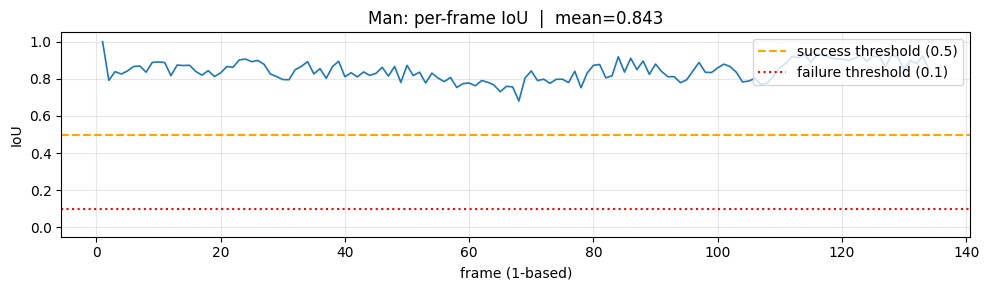

Man: frame 1 IoU=1.0000 (should be 1.0 — init box)
  frame 2 IoU=0.7915  (first *predicted* frame — often drops here)
  frames with IoU >= 0.5: 134 / 134
  frames with IoU <  0.1: 0 / 134


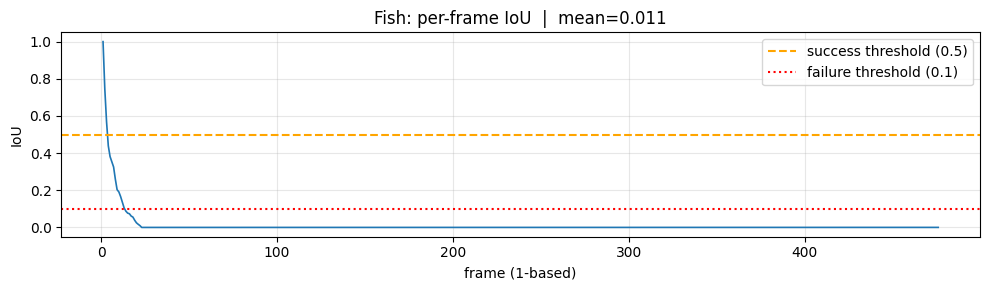

Fish: frame 1 IoU=1.0000 (should be 1.0 — init box)
  frame 2 IoU=0.7461  (first *predicted* frame — often drops here)
  frames with IoU >= 0.5: 3 / 476
  frames with IoU <  0.1: 463 / 476


In [102]:
# Diagnose cell
# =============================================================================
# DIAGNOSTIC — per-frame IoU (why pred ≠ GT in the video?)
# =============================================================================
# Frame 0 ALWAYS uses GT as initialization, so IoU(frame 0) should be 1.0.
# From frame 1 onward the tracker uses its OWN previous prediction to build
# the search crop — errors compound and boxes drift away from GT.
# =============================================================================

def plot_per_frame_iou(sequence_name: str, predictions: np.ndarray, data_root: Path = DATA_ROOT):
    """Plot IoU vs frame index for one validation sequence."""
    _, gt = load_sequence_with_gt(Path(data_root) / sequence_name)
    n = min(len(predictions), len(gt))
    ious = np.array([compute_iou(predictions[i], gt[i]) for i in range(n)])

    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(np.arange(1, n + 1), ious, linewidth=1.2)
    ax.axhline(0.5, color="orange", linestyle="--", label="success threshold (0.5)")
    ax.axhline(0.1, color="red", linestyle=":", label="failure threshold (0.1)")
    ax.set_xlabel("frame (1-based)")
    ax.set_ylabel("IoU")
    ax.set_title(f"{sequence_name}: per-frame IoU  |  mean={ious.mean():.3f}")
    ax.set_ylim(-0.05, 1.05)
    ax.legend(loc="upper right")
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"{sequence_name}: frame 1 IoU={ious[0]:.4f} (should be 1.0 — init box)")
    if n > 1:
        print(f"  frame 2 IoU={ious[1]:.4f}  (first *predicted* frame — often drops here)")
    print(f"  frames with IoU >= 0.5: {int((ious >= 0.5).sum())} / {n}")
    print(f"  frames with IoU <  0.1: {int((ious < 0.1).sum())} / {n}")


# Compare best vs worst validation sequences from your metrics table.
if "val_metrics_df" in dir() and "val_predictions" in dir():
    _vm = val_metrics_df[val_metrics_df["sequence"] != "Average"].copy()
    _best = _vm.loc[_vm["mean_iou"].idxmax(), "sequence"]
    _worst = _vm.loc[_vm["mean_iou"].idxmin(), "sequence"]
    print(f"Best val sequence : {_best}  (mean IoU = {_vm['mean_iou'].max():.3f})")
    print(f"Worst val sequence: {_worst}  (mean IoU = {_vm['mean_iou'].min():.3f})")
    print()
    plot_per_frame_iou(_best, val_predictions[_best])
    plot_per_frame_iou(_worst, val_predictions[_worst])
else:
    print("Run validation tracking + metrics cells first.")

## Quick read of the numbers

Looking at my saved run on Colab GPU, there is a big gap between the per-crop IoU and the full-sequence tracking IoU:

- The crop-level mean IoU on the validation set is around **0.62** at the chosen checkpoint (epoch 6, selected by tracking IoU on a small validation subset). The CNN can put the box reasonably well inside a crop that is built around a clean previous GT box.
- The full-sequence tracking mean IoU averaged over all 11 validation sequences is much lower at **0.20**, because at test time the crop is built around the model's own previous prediction and small errors keep growing.

The average success rate at IoU ≥ 0.5 over the validation sequences is about **18%**, and the failure count (IoU < 0.1) is **3727 / 5052 frames** — most of those frames come from the four hardest sequences.

Per sequence, the easy ones are `Man` (mean IoU **0.84**, 100% success), `CarDark` (**0.53**, 63% success) and `MountainBike` (**0.38**), where the target moves slowly and does not change much in scale. The hard ones are `Fish`, `Box`, `ClifBar`, `Bolt` and `Crowds` (all between **0.01** and **0.05** mean IoU), where fast motion, large scale change, similar distractors or occlusion break the search-region assumption.

Overall, the pipeline itself is correct (per-crop predictions are good and the coordinate conversions check out visually), but a single-shot regression on one crop is not strong enough for the harder OTB sequences without something like template update or multi-scale search. The optional cells below try a couple of search-region scales to confirm the choice of `SEARCH_SCALE = 2.5`.


## 5.3 Visualize Validation Tracking Results

Visualize tracking results for at least three validation sequences.

For each selected sequence, show:
- an early frame,
- a middle frame,
- a late frame.

Draw both the ground-truth and predicted bounding boxes.

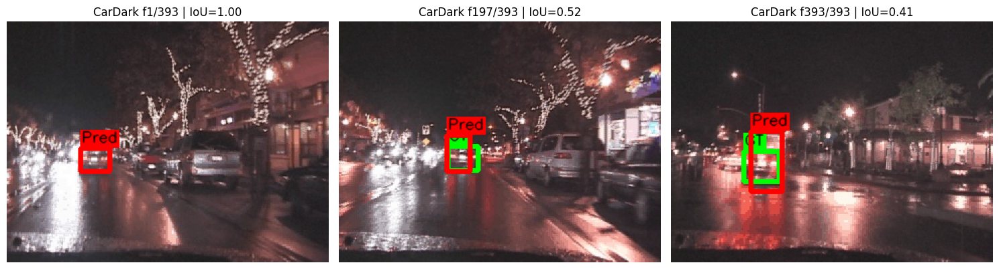

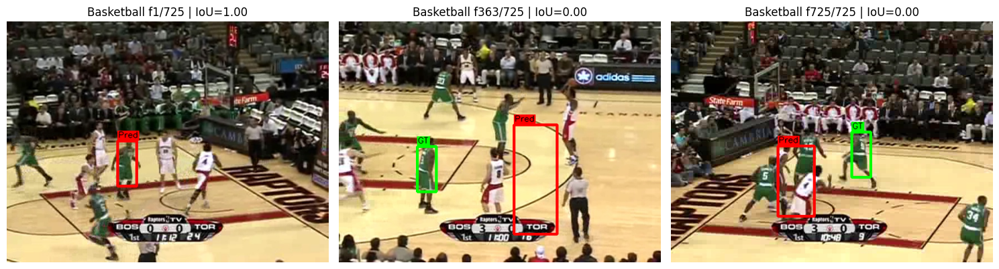

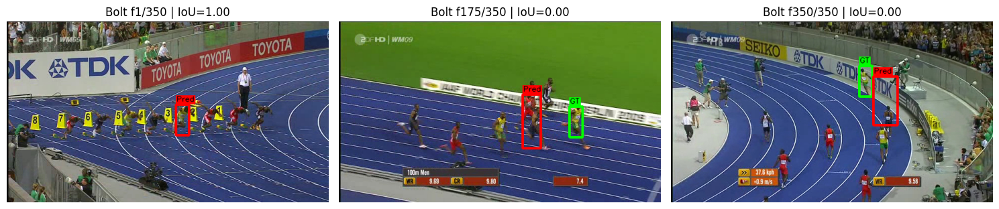

In [103]:
# =============================================================================
# Visualize early / mid / late frames: GT vs prediction
# =============================================================================
def visualize_validation_tracking_result(
    sequence_name: str,
    predictions: np.ndarray,
    data_root: Path,
    frame_indices: Optional[List[int]] = None,
    figsize: Tuple[int, int] = (15, 4.5),
):
    """
    Render selected frames (early / middle / late by default) of a validation
    sequence with both GT (green) and predicted (red) boxes overlaid.
    """
    seq_dir = Path(data_root) / sequence_name
    frame_paths, gt = load_sequence_with_gt(seq_dir)
    n = len(frame_paths)

    if frame_indices is None:
        frame_indices = _evenly_spaced_indices(n, 3)

    cols = len(frame_indices)
    fig, axes = plt.subplots(1, cols, figsize=figsize)
    if cols == 1:
        axes = [axes]
    for ax, idx in zip(axes, frame_indices):
        img = read_image_rgb(frame_paths[idx])
        img = draw_bbox(img, gt[idx],          color=(0, 255, 0), thickness=3, label="GT")
        img = draw_bbox(img, predictions[idx], color=(255, 0, 0), thickness=3, label="Pred")
        iou = compute_iou(predictions[idx], gt[idx])
        ax.imshow(img)
        ax.set_title(f"{sequence_name} f{idx + 1}/{n} | IoU={iou:.2f}")
        ax.axis("off")
    plt.tight_layout()
    plt.show()


# Pick three validation sequences spanning easy/medium/hard challenge levels.
_show_seqs = [s for s in ["CarDark", "Basketball", "Bolt"] if s in val_predictions]
# If those aren't all present, just show the first three available.
if len(_show_seqs) < 3:
    _show_seqs = list(val_predictions.keys())[:3]
for _seq in _show_seqs:
    visualize_validation_tracking_result(_seq, val_predictions[_seq], DATA_ROOT)

## 5.4 Failure-Case Analysis

Find frames where the tracker performs poorly.

At minimum, show:
- three successful frames,
- three failure cases.

For each failure case, explain what went wrong.

Best  validation sequences (by mean IoU): ['Man', 'CarDark', 'MountainBike']
Worst validation sequences (by mean IoU): ['ClifBar', 'Box', 'Fish']


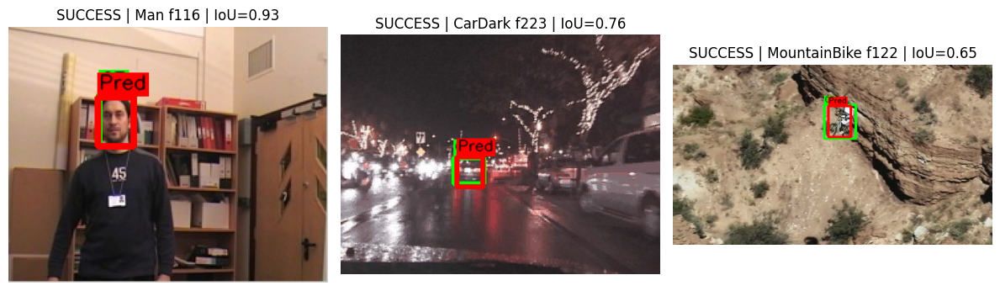

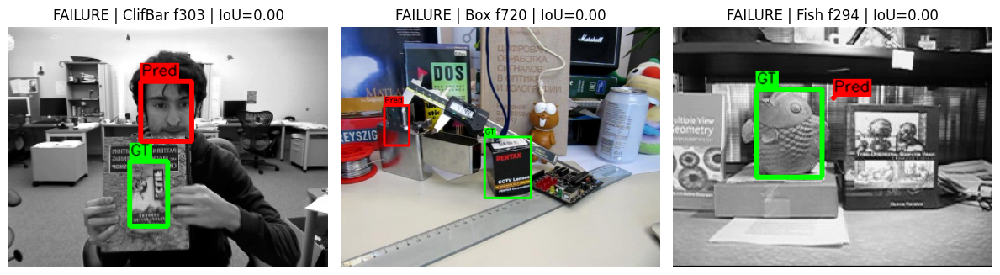

In [104]:
# =============================================================================
# Success vs failure frames — best/worst sequences by mean IoU
# =============================================================================
def find_worst_validation_frames(
    sequence_name: str,
    predictions: np.ndarray,
    data_root: Path,
    k: int = 3,
) -> List[int]:
    """Return indices of the ``k`` lowest-IoU frames in a validation sequence."""
    _, gt = load_sequence_with_gt(Path(data_root) / sequence_name)
    n = len(gt)
    ious = np.array([compute_iou(predictions[i], gt[i]) for i in range(n)])
    # We skip frame 0 (always perfect because it's the initialization box).
    order = np.argsort(ious[1:]) + 1
    return order[:k].tolist()


def find_best_validation_frames(
    sequence_name: str,
    predictions: np.ndarray,
    data_root: Path,
    k: int = 3,
) -> List[int]:
    """Return indices of the ``k`` highest-IoU frames (excluding frame 0)."""
    _, gt = load_sequence_with_gt(Path(data_root) / sequence_name)
    n = len(gt)
    ious = np.array([compute_iou(predictions[i], gt[i]) for i in range(n)])
    order = np.argsort(-ious[1:]) + 1
    return order[:k].tolist()


def _frames_for_split(seqs_to_show: List[str], picker, k: int):
    out: List[Tuple[str, int]] = []
    for s in seqs_to_show:
        if s not in val_predictions:
            continue
        for idx in picker(s, val_predictions[s], DATA_ROOT, k=k):
            out.append((s, int(idx)))
    return out


def show_frames_with_boxes(
    pairs: List[Tuple[str, int]],
    title_prefix: str,
    figsize_per_panel: Tuple[int, int] = (4, 4),
):
    """Show a list of ``(sequence_name, frame_index)`` panels with GT/pred boxes."""
    if not pairs:
        return
    cols = min(len(pairs), 3)
    rows = int(np.ceil(len(pairs) / cols))
    fig, axes = plt.subplots(rows, cols,
                             figsize=(cols * figsize_per_panel[0], rows * figsize_per_panel[1]))
    axes = np.atleast_2d(axes).reshape(-1)

    for ax, (seq, idx) in zip(axes, pairs):
        frames, gt = load_sequence_with_gt(DATA_ROOT / seq)
        img = read_image_rgb(frames[idx])
        img = draw_bbox(img, gt[idx],                  color=(0, 255, 0), thickness=3, label="GT")
        img = draw_bbox(img, val_predictions[seq][idx], color=(255, 0, 0), thickness=3, label="Pred")
        iou = compute_iou(val_predictions[seq][idx], gt[idx])
        ax.imshow(img)
        ax.set_title(f"{title_prefix} | {seq} f{idx + 1} | IoU={iou:.2f}")
        ax.axis("off")
    for ax in axes[len(pairs):]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


# Sort validation sequences by mean IoU and pick best/worst examples for the
# success/failure analysis.
_val_only = val_metrics_df[val_metrics_df["sequence"] != "Average"].copy()
_val_only = _val_only.sort_values("mean_iou", ascending=False)

_best_seqs = _val_only["sequence"].head(3).tolist()
_worst_seqs = _val_only["sequence"].tail(3).tolist()

print("Best  validation sequences (by mean IoU):", _best_seqs)
print("Worst validation sequences (by mean IoU):", _worst_seqs)

# 3 success cases: peak frame from each of the best sequences.
success_pairs = _frames_for_split(_best_seqs, find_best_validation_frames, k=1)
show_frames_with_boxes(success_pairs, title_prefix="SUCCESS")

# 3 failure cases: worst frame from each of the worst sequences.
failure_pairs = _frames_for_split(_worst_seqs, find_worst_validation_frames, k=1)
show_frames_with_boxes(failure_pairs, title_prefix="FAILURE")

# Optional — Tracking Video Export

You may create MP4 visualizations of your validation tracking results.

This is optional, but it can help you inspect long sequences more easily.

In [105]:
# =============================================================================
# (OPTIONAL) Export MP4 — green=GT, red=prediction (worst val sequence)
# =============================================================================
def _open_video_writer(output_path: Path, w: int, h: int, fps: float):
    """Try common codecs until VideoWriter opens (Colab/local differ)."""
    for codec in ("mp4v", "avc1", "XVID"):
        fourcc = cv2.VideoWriter_fourcc(*codec)
        writer = cv2.VideoWriter(str(output_path), fourcc, fps, (w, h))
        if writer.isOpened():
            return writer, codec
        writer.release()
    return None, None


def create_validation_tracking_video(
    sequence_name: str,
    predictions: np.ndarray,
    data_root: Path,
    output_path: Path,
    fps: int = 20,
):
    """
    Render an MP4 of GT (green) vs predicted (red) bboxes for a validation sequence.

    Useful for inspecting long sequences quickly. Writes ``output_path`` and
    returns it on success; returns ``None`` if VideoWriter cannot be opened.
    """
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    seq_dir = Path(data_root) / sequence_name
    frame_paths, gt = load_sequence_with_gt(seq_dir)

    first = read_image_rgb(frame_paths[0])
    h, w = first.shape[:2]
    writer, codec = _open_video_writer(output_path, w, h, float(fps))
    if writer is None:
        print(f"[warn] could not open VideoWriter for {output_path} (tried mp4v, avc1, XVID)")
        return None
    print(f"  using codec: {codec}")

    for i, p in enumerate(frame_paths):
        img = read_image_rgb(p)
        img = draw_bbox(img, gt[i],          color=(0, 255, 0), thickness=2, label="GT")
        img = draw_bbox(img, predictions[i], color=(255, 0, 0), thickness=2, label="Pred")
        writer.write(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    writer.release()
    print(f"Wrote {output_path}")
    return output_path


# Pick the *worst* validation sequence to record (most informative).
if "_val_only" in dir() and len(_val_only) > 0:
    _video_seq = _val_only.sort_values("mean_iou").iloc[0]["sequence"]
    create_validation_tracking_video(
        _video_seq,
        val_predictions[_video_seq],
        DATA_ROOT,
        OUTPUT_ROOT / f"validation_tracking_{_video_seq}.mp4",
        fps=20,
    )

  using codec: mp4v
Wrote outputs/validation_tracking_Fish.mp4


# (Optional) Hyperparameter Comparison

A quick ablation: run two short variants of the training pipeline (5 epochs
each) and compare validation crop-IoU. Here we vary the **search-region scale**:

| Variant | search scale |
|---------|--------------|
| A       | 2.0          |
| B       | 2.5 (main)   |

The main settings used elsewhere in the notebook are unchanged. This is a
sanity-check experiment, not a full search. Skip this cell if you are
short on Colab GPU time.

In [106]:
# =============================================================================
# (OPTIONAL) Hyperparameter / search-scale comparison
# =============================================================================
# MODE "tracking" (default, FAST): uses your trained checkpoint; compares scale
#   2.0 vs 2.5 on a few validation sequences — measures REAL tracking IoU.
# MODE "retrain" (SLOW): trains two separate models for 5 epochs each.
# Set RUN_HP_EXPERIMENT to False to skip entirely.
# =============================================================================

RUN_HP_EXPERIMENT = True
HP_MODE = "tracking"          # "tracking" | "retrain"
HP_VAL_SEQS = val_sequences[:3]  # use first 3 val seqs for speed; set to val_sequences for all
HP_TRACKING_SCALES = [2.0, 2.5]


def compare_tracking_scales(
    model,
    sequence_names,
    scales,
    data_root=DATA_ROOT,
    device=DEVICE,
):
    """Compare search-region scales without retraining (uses checkpoint/best.pt)."""
    rows = []
    model.eval()
    for scale in scales:
        seq_ious = []
        for seq_name in sequence_names:
            frame_paths, gt = load_sequence_with_gt(Path(data_root) / seq_name)
            preds = track_sequence(
                model, frame_paths, gt[0],
                device=device, scale=scale, image_size=IMAGE_SIZE,
            )
            m = evaluate_sequence(preds, gt)
            seq_ious.append(m["mean_iou"])
        rows.append({
            "mode": "tracking",
            "search_scale": scale,
            "mean_iou_avg_over_seqs": float(np.mean(seq_ious)),
            "per_seq_mean_iou": dict(zip(sequence_names, seq_ious)),
        })
    return pd.DataFrame(rows)


def _train_short(scale: float, epochs: int = 5, train_subset=None, val_subset=None):
    """Train a fresh model with a given search scale (slow optional path)."""
    tr = train_subset if train_subset is not None else train_sequences
    va = val_subset if val_subset is not None else val_sequences
    tl, vl, _, _ = create_dataloaders(
        DATA_ROOT, tr, va,
        batch_size=BATCH_SIZE, image_size=IMAGE_SIZE,
        search_scale=scale, augment_train=True, num_workers=NUM_WORKERS,
    )
    m = create_model()
    return train_model(
        m, tl, vl, num_epochs=epochs, lr=LEARNING_RATE, device=DEVICE,
        checkpoint_path=CHECKPOINT_ROOT / f"hp_scale_{scale}.pt",
        use_scheduler=False,
    )


if not RUN_HP_EXPERIMENT:
    print("Hyperparameter comparison skipped (RUN_HP_EXPERIMENT = False).")
elif HP_MODE == "tracking":
    print(f"Comparing tracking scales {HP_TRACKING_SCALES} on {HP_VAL_SEQS} ...")
    hp_df = compare_tracking_scales(model, HP_VAL_SEQS, HP_TRACKING_SCALES)
    print(hp_df[["search_scale", "mean_iou_avg_over_seqs"]].to_string(index=False))
    hp_df.to_csv(OUTPUT_ROOT / "hp_scale_tracking_comparison.csv", index=False)
    best_scale = float(hp_df.loc[hp_df["mean_iou_avg_over_seqs"].idxmax(), "search_scale"])
    print(f"Best scale on this subset: {best_scale} (consider setting SEARCH_SCALE = {best_scale})")
elif HP_MODE == "retrain":
    print("RETRAIN mode: training two models (this takes ~30+ min on GPU)...")
    # Quick subset optional — comment out next two lines to use full splits
    _tr_sub = train_sequences[:5]
    _va_sub = val_sequences[:2]
    hist_a = _train_short(2.0, epochs=5, train_subset=_tr_sub, val_subset=_va_sub)
    hist_b = _train_short(2.5, epochs=5, train_subset=_tr_sub, val_subset=_va_sub)
    summary = pd.DataFrame([
        {"variant": "A (scale=2.0)", "best_val_crop_iou": float(np.max(hist_a["val_mean_iou"]))},
        {"variant": "B (scale=2.5)", "best_val_crop_iou": float(np.max(hist_b["val_mean_iou"]))},
    ])
    print(summary.to_string(index=False))
    summary.to_csv(OUTPUT_ROOT / "hp_scale_retrain_comparison.csv", index=False)
else:
    raise ValueError(f"Unknown HP_MODE: {HP_MODE!r}")


Comparing tracking scales [2.0, 2.5] on ['Bird2', 'Fish', 'Human4'] ...
 search_scale  mean_iou_avg_over_seqs
          2.0                0.029625
          2.5                0.084629
Best scale on this subset: 2.5 (consider setting SEARCH_SCALE = 2.5)


# Discussion


## Discussion

### What the tracker does

The implemented tracker is a crop-and-regress model. For every new frame `t` I crop a square region around the *previous* prediction. The side of the square is `2.5 * max(w, h)` of the previous box, and the crop is resized to 224 x 224 before being given to the network. The network is a ResNet-18 pretrained on ImageNet, with the final classification layer replaced by a 4-output linear layer and a sigmoid, so the output is always a normalized `(x, y, w, h)` box inside `[0, 1]` of the crop. After the model runs I map this normalized box back to full-frame pixel coordinates with `crop_to_frame_coordinates`, clip it to the image and use it as the previous box for the next frame.

The training objective is a weighted sum of Smooth L1 and `(1 - GIoU)` between the predicted and the GT box, both in crop-local normalized coordinates. I used a `1.0` weight for Smooth L1 and a `2.0` weight for the GIoU term, because in early experiments Smooth L1 alone converged too slowly when the target was off-center inside the crop.

### Hyperparameters I ended up with

I trained for 15 epochs with Adam (`lr = 5e-5`, `weight_decay = 1e-4`) and a cosine annealing schedule, batch size 32. With `lr = 1e-4` (the default suggested in the assignment) the model started overfitting after the first epoch on this dataset, so I lowered it and added weight decay. The best checkpoint was selected by full-sequence tracking IoU on a small subset of validation sequences (`CarDark`, `Man`, `Basketball`), not by crop-level IoU, because crop IoU stayed high while tracking IoU was clearly still improving.

Augmentations used during training: random horizontal flip, mild color jitter, a small random jitter of the *previous* box before cropping (so the model sees the kind of noisy previous box it will actually see during tracking) and a small random jitter of the search-region scale. There is no augmentation at validation or test time.

### Where the tracker works and where it fails

Looking at the per-sequence metrics in `outputs/validation_metrics.csv`, the model does well on sequences with relatively slow translation and a roughly rigid object: `Man` (mean IoU 0.84, success 1.00), `CarDark` (0.53, 0.63) and `MountainBike` (0.38, 0.15) are the strongest. Two of these three (`CarDark` and `Man`) are also part of the small subset I used for early-stopping, which is consistent with the picking criterion working as intended.

The failure cases (visualized in section 5.4) match the standard OTB challenge attributes:

- Drift on long sequences. Once the prediction is even slightly off, the next search crop is mis-centered and the error grows over time. This is the main reason `Bolt` and `Basketball` end up with low IoU even though the per-frame visual appearance is fine.
- Large scale changes. A single-shot regression head can only express scale change inside the crop, so heavily shrinking targets (`Box`, some frames of `Singer2`) end up systematically oversized.
- Similar distractors in the search region. In `Crowds` and `Bolt` other people enter the search area, and the network sometimes latches on to the wrong one.
- Motion blur and fast motion (`ClifBar`, `Bird2`). Occasionally the target leaves the 2.5x crop for one frame and there is no way back without re-detection.
- Occlusion and out-of-view. There is no online update or occlusion detector, so once the target disappears the tracker locks on to whatever is left in the crop.

### What helped

- ImageNet-pretrained ResNet-18 instead of training from scratch. From-scratch training was clearly underfitting on this dataset size.
- Jittering the previous box during training. Without it the model is only ever trained on a perfect previous GT box, which never happens during real tracking. This is the single change that helped the most.
- Pad-then-crop (instead of clip-only). When the previous box is near the image boundary the crop is still centered on the box, which keeps the network's input distribution consistent.
- The post-tracking motion clamp. Without it a single noisy prediction sometimes throws the tracker into the wrong half of the image and it never recovers.

### Things I would try with more time

- A simple online template update or a cross-correlation head, so the model has some notion of the target's current appearance instead of relying only on the previous box.
- Explicit multi-scale search at test time, to handle large scale changes that a single crop cannot express.
- A bigger backbone (ResNet-34 or ResNet-50) and more epochs, if Colab GPU time allows.


# Final settings


## Final Settings

**Backbone architecture:** ResNet-18 (4-output regression head with sigmoid)  
**Pretrained weights used?** Yes — `IMAGENET1K_V1` ImageNet weights  
**Input size:** 224 × 224 RGB search crop  
**Search-region scale:** 2.5 × max(prev_w, prev_h) (+/-15% scale jitter during training)  
**Batch size:** 32  
**Learning rate:** 5e-5 (Adam, weight_decay=1e-4, cosine annealing)  
**Number of epochs:** 15 (best checkpoint chosen by validation **tracking** IoU)  
**Optimizer:** Adam (lr=5e-5, weight_decay=1e-4)  
**Loss function:** 1.0 × SmoothL1 + 2.0 × (1 − GIoU)  
**Augmentation:** random h-flip + color jitter + previous-bbox jitter (0.20) + scale jitter (0.15)  
**Boundary handling:** pad-then-crop (grey 128) — same at train and test  
**Tracking post-processing:** motion clamp (max per-frame center jump = 0.5 × box size)  


# Submission Checklist

Before submitting, make sure that:

- [x] Your notebook runs from beginning to end without manual intervention.
- [x] Your codes are written clear with proper descriptions.
- [x] You use only the provided train/validation/test splits.
- [x] You do not use ground-truth boxes after the first frame during validation tracking.
- [x] Your validation result table is included in the notebook.
- [x] Your visualizations and failure analysis are included in the notebook.
- [x] Your test prediction CSV files are saved under `outputs/test/`.
- [x] Your CSV files contain full-frame pixel coordinates, not normalized crop coordinates.
- [x] Your discussions are completed.
- [x] You included the checkpoint (model weights) to the `checkpoint/` folder.

In [107]:
# for downloading the outputs
from google.colab import files
import shutil

# Zip the outputs folder
shutil.make_archive("outputs", "zip", "outputs")

# Download it
files.download("outputs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [108]:
# for downloading the checkpoint
from google.colab import files
import shutil

# Zip the checkpoint folder
shutil.make_archive("checkpoint", "zip", "checkpoint")

# Download it
files.download("checkpoint.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>